# <span style="color:dodgerblue">Evidence of Climate Change in the Polar Regions
This notebook goes on to explain and visualize climate change in the polar regions. This was created by Grace Woolslayer, contact grace.woolslayer@temple.edu if you have any questions. 

### importing essential packages

In [1]:
### Note new packages that we are importing!!
from cartopy import crs as ccrs, feature as cfeature        ## for plotting geo spatial data
import cmocean                    ## for nice colormaps.
import matplotlib.path as mpath   ## needed for nice looking polar projections.
import momlevel as ml             ## for computing annual mean and seasonal cycle.
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import zarr  # to read in Zarr format
import gcsfs # to read google cloud data
import cftime

In [2]:
%matplotlib inline                           
%config InlineBackend.figure_format='retina' 
plt.rcParams['figure.figsize'] = 12,6

---

# <span style="color:navy"> Background<span> 




Most information was learned from Dr. Rebecca Beadling's Observing and Modeling Climate Change course taken at Temple University but additional resources can be found here:
- [NASA: Five Facts to Help You Understand Sea Ice](https://climate.nasa.gov/news/3122/five-facts-to-help-you-understand-sea-ice/)
- [Sea Ice Overview from NSIDC](https://nsidc.org/learn/parts-cryosphere/sea-ice)
- [Science behind Sea Ice from NSIDC](https://nsidc.org/learn/parts-cryosphere/sea-ice/science-sea-ice#:~:text=When%20temperatures%20increase%20in%20spring,out%20completely%20during%20the%20summer)
- [Chanpter 3: Polar Regions from IPCC Special Report on the Ocean and Cryosphere in a Changing Climate](https://www.ipcc.ch/srocc/)

#  What is sea ice? </span> 
Before we start visualizing sea ice, let's first understand what it is. It sounds self-explanatory but they should not be confused with ice sheets, or icebergs that reside in the sea. Sea ice is frozen seawater that floats, forms, and melts in polar oceans. These polar oceans are found in the Arctic (Northern hemisphere) and Antarctica (Southern hemisphere). Sea ice is the boundary between the atmosphere and the ocean. It is responsible for regulating heat fluxes between the two. Since it impacts atmospheric temperature gradients, it also affects surface winds. Wind direction and strength are driven by temperature gradients. Sea ice plays an important role in ocean circulation and moderating Earth's surface temperatures by having a high albedo. Sea ice reflects ~50-70% of incoming solar radiation while the open ocean only reflects ~6-10%. The loss of sea ice means that there will be more dark ocean exposed which lowers planetary albedo and allows more solar radiation to be absorbed rather than reflected. 

Another important distinction to make is also the difference between sea ice concentration and sea ice extent. Sea ice concentration is what is observed and recorded. It is determined by the percentage of a grid cell or pixel it takes up. Sea ice extent on the other hand is what scientists use to quantify and track sea ice concentration. To calculate sea ice extent you would multiply sea ice concentration by the grid cell area. Sea ice concentration is a fractional value, making it unitless. Since we are taking a unitless value and multiplying it by area, we are left with length squared. The grid cell area in this project was given in meters squared so that is what units of sea ice extent will be in unless converted to millions of kilometers squared, which are the standard units. Sea ice thickness is also another important factor to consider when looking at the longevity of sea ice. Sea ice thickness is measured in meters. Sea ice in Antarctica is much thinner than the sea ice in the Arctic which is why it only lasts during the  winter and melts in the summer. Antarctic sea ice is only ~1-2 meters thick while Arctic sea ice is ~2-5 meters thick which allows it to survive much longer.

### Here is a visualization created by Dr. Zack Labe that will help you wrap your head around the difference between sea ice concentration and sea ice extent. 

![](https://zacklabe.com/wp-content/uploads/2022/08/9f611-seaicetypes.png)

# <span style="color:dodgerblue"> Antarctic Sea Ice vs Arctic Sea Ice </span> 
Antarctic and Arctic sea ice have distinct qualitative and quantitative characteristics that we will soon visualize. The main difference between  Arctic and Antarctic sea ice is their geographic location. Arctic sea ice is located in the northern hemisphere and is bound by land. Since it is surrounded an ocean surrounded by land, it has a limited extent and is susceptible to ridging. Ridging is a process that occurs when sea ice is smushed together by wind or ocean currents. The resulting smushing causes "piles" of sea ice that become very thick and more resistant to melting. As mentioned before, since Arctic sea ice is so thick, it lasts much longer. Even when summertime comes around, most of the ice stays frozen. Another reason that Arctic and Antarctic sea ice look different is because of the surrounding ocean circulation patterns that surround each area. The currents that surround the Arctic weave their way through gaps in the land whereas the current that surrounds Antarctica has a circular pattern. Antarctic sea ice is found in the southern hemisphere where land is surrounded by ocean. The sea ice here is less constrained and can grow as far as the temperatures and ocean currents will allow. However, the sea ice is much thinner as a result and almost all of it that forms in the winter melts during the summertime. When sea ice melts (in Antarctica and the Arctic), it does not have a significant contribution to sea level rise because it already has displaced water by being in it. Think about this concept in terms of ice in a glass of water. If you were to add ice to a glass of water, would you expect it to overflow when the ice melts? No, because the volume of water displaced by the ice is the same as the amount of water when melted. The dynamic between the freshwater ice melting in a saltwater ocean is a bit different but the sea level rise is considered negligible. Although some scientists believe that even though the sea level rise due to sea ice melting is minor, it should still be considered when estimating sea level rise. However, for the purpose of this project, we will consider the melting of sea ice to be negligible. 

![](https://nsidc.org/sites/default/files/images/ArcticVSAntarctic_sea-ice_MarchVSSeptemer2020_0.jpg)

# <span style="color:dodgerblue"> Arctic Amplification </span> 
Arctic amplification describes the phenomenon of the Arctic warming twice as fast as mid-latitudes. In the early 2000s, average global temperatures had risen 0.6 degrees celsius above temperatures measured from a baseline period 1951-1980. The temperatures in the Arctic in the early 2000s were a concerning 2 degrees celsius warmer than the baseline ([NASA](https://climate.nasa.gov/news/927/arctic-amplification/)). Scientists explain this accelerated warming through the loss of sea ice, creating a positive feedback mechanism. As was mentioned earlier, sea ice has a very high albedo which allows it to reflect most of the incoming solar radiation. With temperatures continually rising, the amount of sea ice that can form is declining. This causes more of the dark ocean to be exposed which has a lower albedo. More solar radiation is therefore absorbed which increases temperatures further. 

---

# <span style="color:dodgerblue">SEA ICE CONCENTRATION OBSERVATIONS

### datasets
Monthly Sea Ice Concentration from the NOAA OI SST V2 High Resolution
Dataset from September 1981 to September 2023 on a 1/4 - degree global grid
(25 km). NOAA OI SST V2 High Resolution Dataset data (Huang et al., 2021)
provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

Units: fractional coverage 0 – 1; 0 == no ice, 1 == full grid cell coverage

Huang, B., C. Liu, V. Banzon, E. Freeman, G. Graham, B. Hankins, T. Smith, and
H.-M. Zhang, 2021: Improvements of the Daily Optimum Interpolation Sea
Surface Temperature (DOISST) Version 2.1, Journal of Climate, 34, 2923-
2939. doi: 10.1175/JCLI-D-20-016 [https://www.ncei.noaa.gov/products/optimum-interpolation-sst](https://www.ncei.noaa.gov/products/optimum-interpolation-sst)

Grid cell area provided on the same grid as sea ice observations.
Units: grid cell area ^2
6.1

In [3]:
ees_climate_dir = 'C:/Users/TU_Climate24_Student/Desktop/ees_climate/'
seaice_observations = xr.open_zarr(ees_climate_dir+'3_unit_woolslayer/data/seaice_concentration_data')
seaice_gridcell_area = xr.open_dataset(ees_climate_dir+'3_unit_woolslayer/data/cell_area_seaiceconc.nc')

### two important functions that will allow for the polar projections of sea ice. 

In [3]:
def North_Polar(array,vmin,vmax,cmap):
    subplot_kws = dict(projection=ccrs.NorthPolarStereo()) 
    fig, ax = plt.subplots(figsize=[10, 5],subplot_kw=subplot_kws)
    
    array.plot(ax=ax,
               transform =ccrs.PlateCarree(),
               vmin=vmin,
               vmax=vmax,
               extend='both',
               cmap=cmap,levels=30)

    # Limit the map to -50 degrees latitude and below.
    ax.set_extent([-180, 180, 50, 90], ccrs.PlateCarree())
    
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    ax.coastlines()

In [4]:
def South_Polar(array,vmin,vmax,cmap):
    subplot_kws = dict(projection=ccrs.SouthPolarStereo()) 
    fig, ax = plt.subplots(figsize=[10, 5],subplot_kw=subplot_kws)
    
    array.plot(ax=ax,
               transform =ccrs.PlateCarree(),
               vmin=vmin,
               vmax=vmax,
               extend='both',
               cmap=cmap, levels=30)

    # Limit the map to -50 degrees latitude and below.
    ax.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
    
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    ax.coastlines()

In [4]:
seaice_observations

<xarray.Dataset>
Dimensions:  (time: 505, lat: 720, lon: 1440)
Coordinates:
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2023-09-01
Data variables:
    icec     (time, lat, lon) float32 dask.array<chunksize=(32, 90, 180), meta=np.ndarray>
Attributes:
    Conventions:    CF-1.5
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    comment:        Reynolds, et al.(2007) Daily High-Resolution-Blended Anal...
    dataset_title:  NOAA Daily Optimum Interpolation Sea Surface Temperature
    institution:    NOAA/National Centers for Environmental Information
    source:         NOAA/NCEI https://www.ncei.noaa.gov/data/sea-surface-temp...
    title:          NOAA/NCEI 1/4 Degree Daily Optimum Interpolation Sea Surf...
    version:        Version 2.1

In [5]:
seaice_gridcell_area

<xarray.Dataset>
Dimensions:    (lat: 720, lon: 1440)
Coordinates:
  * lat        (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon        (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
Data variables:
    cell_area  (lat, lon) float64 ...

In [6]:
#extracting ice concentration array
avg_seaice_conc=seaice_observations.icec.mean(dim=['time'])
avg_seaice_conc

<xarray.DataArray 'icec' (lat: 720, lon: 1440)>
dask.array<mean_agg-aggregate, shape=(720, 1440), dtype=float32, chunksize=(90, 180), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9

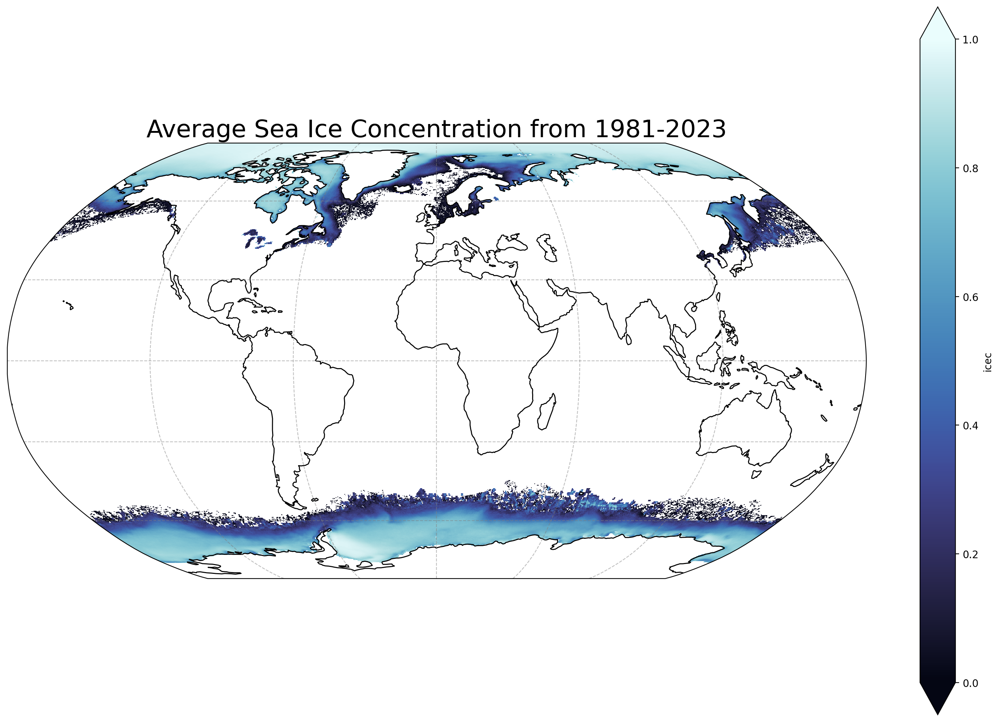

In [18]:
#showing what sea ice extent looks like on a global scale
subplot_kws=dict(projection=ccrs.Robinson(),
                 facecolor='white')

### set up figure settings
fig, (ax1) = plt.subplots(ncols=1,
                               nrows=1,
                               figsize=(15,10),
                               subplot_kw=subplot_kws) 

### plot data
avg_seaice_conc.sel(lat=slice(-89.88,89.88)).plot(ax=ax1, 
                                cmap=cmocean.cm.ice, 
                                vmin=0,vmax=1, extend='both',
                                transform=ccrs.PlateCarree())

## customize subplots
ax1.set_title('Average Sea Ice Concentration from 1981-2023',fontsize=24)
ax1.coastlines()
plt.tight_layout() ## make it look nicely spaced!

### add some gridlines 
ax1.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 1.** Observed average sea ice concentration from 1981-2023 from the NOAA OI SST V2 High Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Antarctic Sea Ice Concentration During the Wintertime')

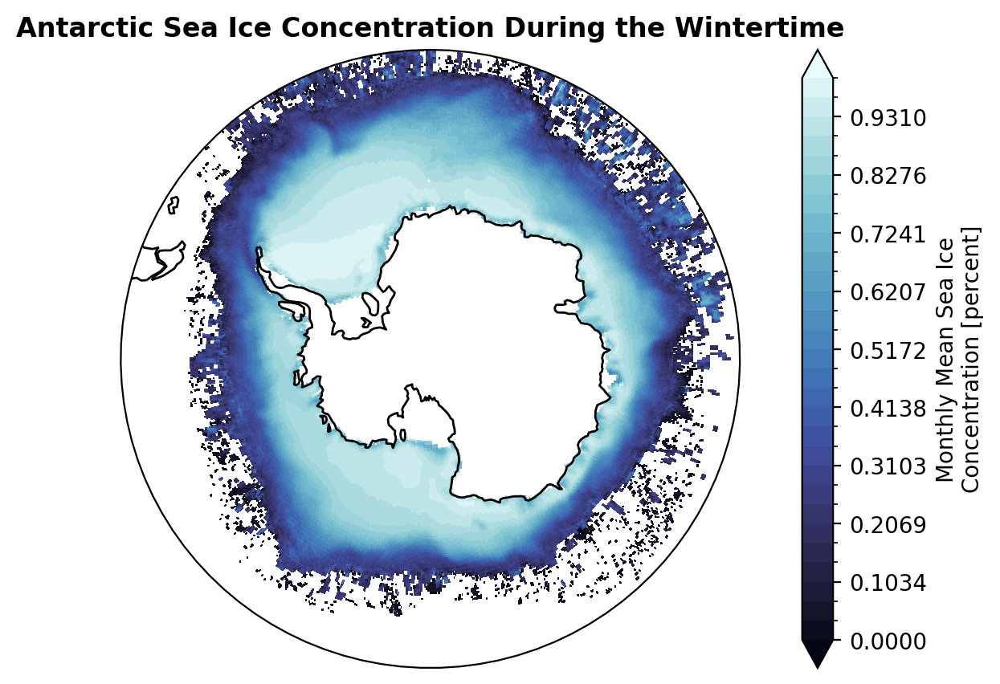

In [24]:
#winter time max
seasons = seaice_observations.icec.groupby('time.season').mean(dim='time')
South_Polar(seasons.sel(season='JJA'),0,1,cmap=cmocean.cm.ice)
plt.title('Antarctic Sea Ice Concentration During the Wintertime',fontweight='bold')

**Figure 2.** Average Antarctic sea ice concentration from 1981-2023 at its maximum during wintertime. Wintertime spans June, July, and August. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Antarctic Sea Ice Concentration During the Summertime')

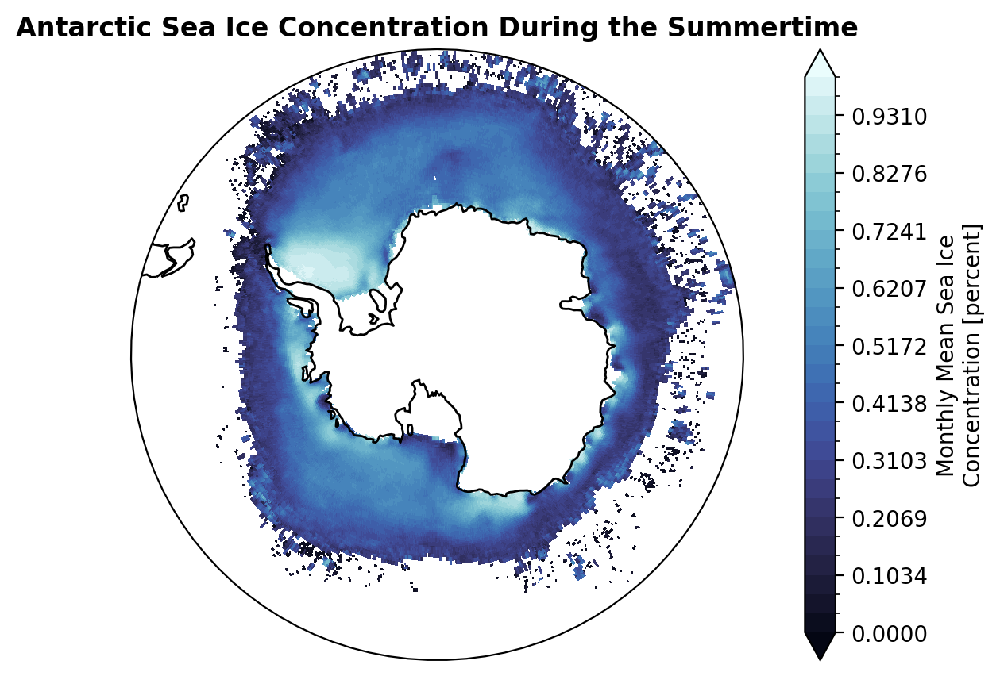

In [25]:
#summer time min
seasons = seaice_observations.icec.groupby('time.season').mean(dim='time')
South_Polar(seasons.sel(season='DJF'),0,1,cmap=cmocean.cm.ice)
plt.title('Antarctic Sea Ice Concentration During the Summertime',fontweight='bold')

**Figure 3.** Average Antarctic sea ice concentration from 1981-2023  at its minimum during the summertime.  Summertime months are December, January, and February. Sea ice concentration from from the NOAA OI SST V2 High Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Arctic Sea Ice Concentration in the Wintertime')

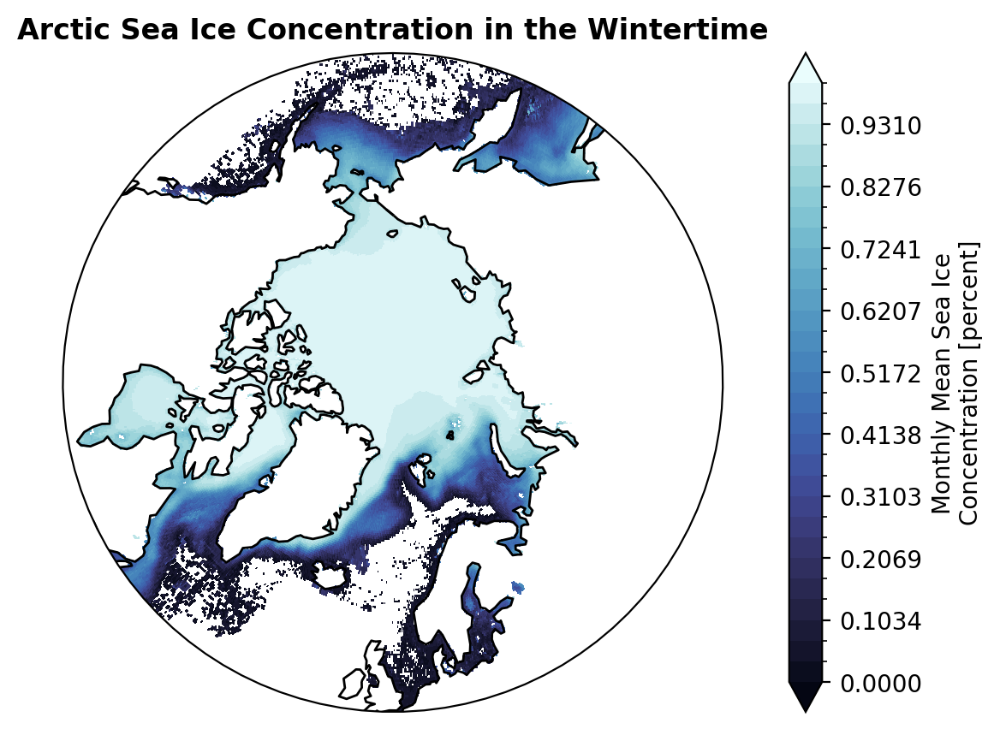

In [22]:
NH_seasons= seaice_observations.icec.groupby('time.season').mean(dim='time')
North_Polar(seasons.sel(season='DJF'),0,1,cmap=cmocean.cm.ice)
plt.title('Arctic Sea Ice Concentration in the Wintertime',fontweight='bold')

**Figure 4.** Average Antarctic sea ice concentration during the wintertime from 1981-2023. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Arctic Sea Ice Concentration in the Summertime')

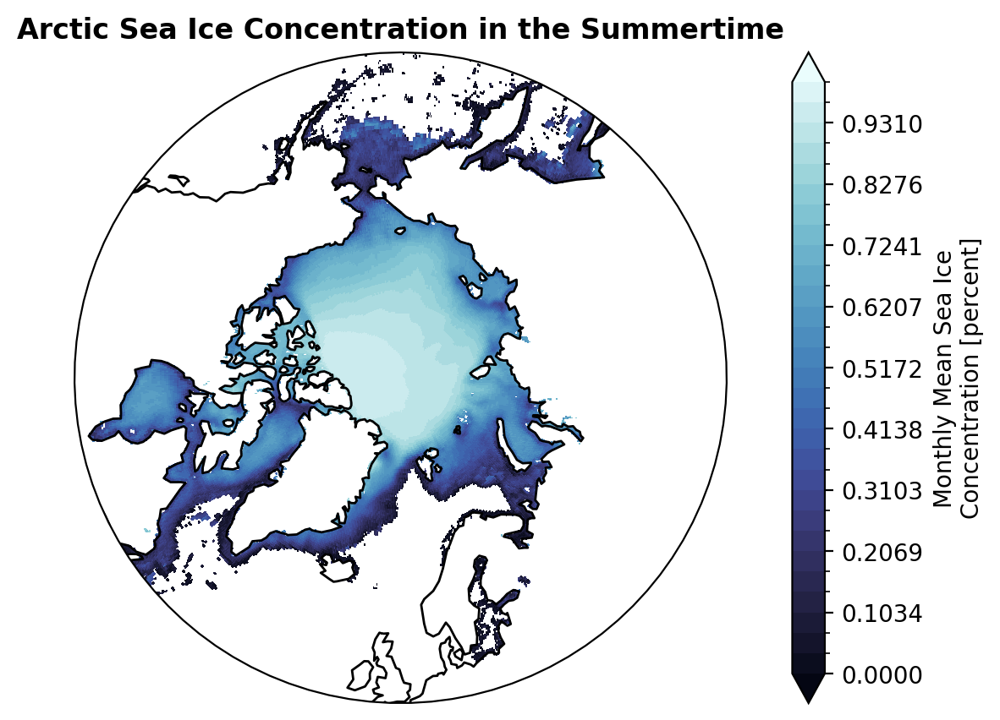

In [23]:
seasons = seaice_observations.icec.groupby('time.season').mean(dim='time')
North_Polar(seasons.sel(season='JJA'),0,1,cmap=cmocean.cm.ice)
plt.title('Arctic Sea Ice Concentration in the Summertime',fontweight='bold')

**Figure 5.** Average Arctic sea ice concentration is at its minimum during the summertime from 1981-2023.. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

# <span style="color:dodgerblue">Sea Ice Extent Analysis

In [7]:
#calculating the extent and converting it to millions km^2
extent= (seaice_observations.icec*seaice_gridcell_area.cell_area)/1000000/1000000
total_extent=extent.sum(dim=['lat','lon'])

In [8]:
extent=seaice_observations.icec*seaice_gridcell_area.cell_area/1000000
extent

<xarray.DataArray (time: 505, lat: 720, lon: 1440)>
dask.array<truediv, shape=(505, 720, 1440), dtype=float64, chunksize=(32, 90, 180), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2023-09-01

# Antarctic Sea Ice Extent

In [9]:
#need to slice latitude to isolate Antartica
ant_lat_slice=extent.sel(lat=slice(-90, 0))
ant_lat_slice

<xarray.DataArray (time: 505, lat: 360, lon: 1440)>
dask.array<getitem, shape=(505, 360, 1440), dtype=float64, chunksize=(32, 90, 180), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... -0.625 -0.375 -0.125
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2023-09-01

In [10]:
#summing sea ice extent over lat and lon
ant_total_sie = ant_lat_slice.sum(dim=['lat','lon'])
ant_total_sie

<xarray.DataArray (time: 505)>
dask.array<sum-aggregate, shape=(505,), dtype=float64, chunksize=(32,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2023-09-01

In [11]:
#need to slice time 1982 - 2010
ant_time_slice=ant_total_sie.sel(time=slice('1982-01-01','2010-12-01')).groupby('time.month').mean(dim='time')
ant_time_slice

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [12]:
#STD
std_1982_2010=ant_total_sie.sel(time=slice('1982-01-01','2010-12-01')).groupby('time.month').std(dim='time')
std_1982_2010

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [13]:
#need to slice time 2012
ant_time_slice_2012=ant_total_sie.sel(time=slice('2012-01-01','2012-12-01')).groupby('time.month').mean(dim='time')
ant_time_slice_2012

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [14]:
#need to slice time 2020
ant_time_slice_2020=ant_total_sie.sel(time=slice('2020-01-01','2020-12-01')).groupby('time.month').mean(dim='time')
ant_time_slice_2020

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [15]:
#need to slice time 2021
ant_time_slice_2021=ant_total_sie.sel(time=slice('2021-01-01','2021-12-01')).groupby('time.month').mean(dim='time')
ant_time_slice_2021

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

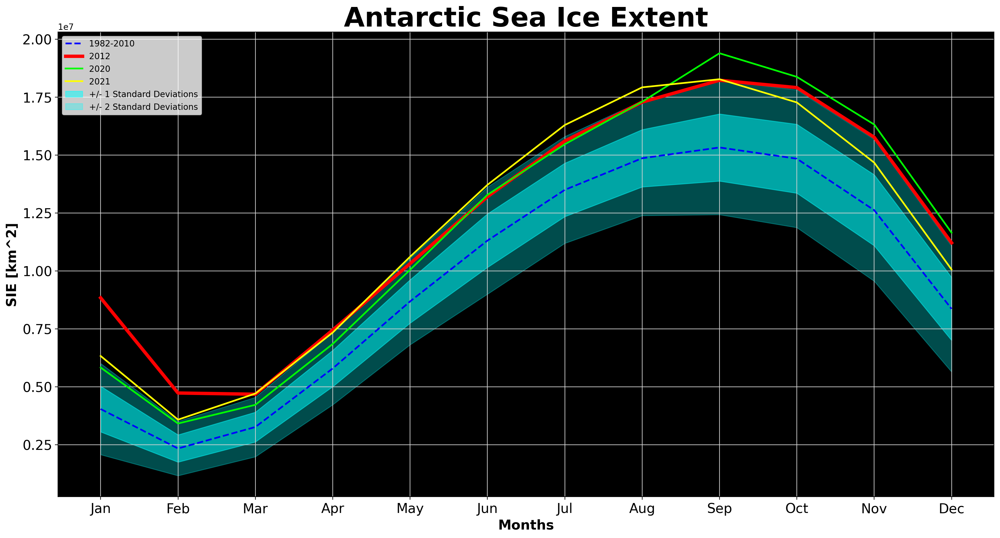

In [25]:
fig, ax = plt.subplots(figsize=(20,10))

ax.plot(ant_time_slice['month'],ant_time_slice, linewidth=2, label= '1982-2010', color='blue',linestyle='--')
ax.plot(ant_time_slice_2012['month'],ant_time_slice_2012, linewidth=4, label= '2012', color='red')
ax.plot(ant_time_slice_2020['month'],ant_time_slice_2020, linewidth=2, label= '2020', color='lime')
ax.plot(ant_time_slice_2021['month'],ant_time_slice_2021, linewidth=2, label= '2021', color='yellow')

ax.fill_between(ant_time_slice['month'], ant_time_slice+std_1982_2010,
                ant_time_slice-std_1982_2010, 
                label='+/- 1 Standard Deviations',alpha=0.5, color='cyan')

ax.fill_between(ant_time_slice['month'], ant_time_slice+(2*std_1982_2010),
                ant_time_slice-(2*std_1982_2010), 
                label='+/- 2 Standard Deviations',alpha=0.3, color='cyan')

ax.set_title('Antarctic Sea Ice Extent',fontsize=32,fontweight='bold')
ax.set_xlabel('Months',fontsize=16,fontweight='bold')
ax.xaxis.set_ticks([1, 2, 3, 4, 5, 6, 7,  8, 9, 10, 11, 12],
              ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

ax.set_ylabel('SIE [km^2]',fontsize=16,fontweight='bold')
ax.tick_params(axis='both', which='major', labelsize=16)


plt.legend()
plt.grid(color='lightgrey')
ax.set_facecolor('black')

**Figure 6.** Average Antarctic sea ice extent throughout various years measured in millions of km^2. Sea ice extent was calculated using sea ice concentration and grid cell area from the NOAA OI SST V2 High-Resolution Dataset that captured observations from September 1981 to September 2023 on a 1/4-degree global grid (25 km).

# Arctic Sea Ice Extent

In [17]:
#need to slice latitude to isolate the Arctic
arctic_lat_slice=extent.sel(lat=slice(0, 90))
arctic_lat_slice

<xarray.DataArray (time: 505, lat: 360, lon: 1440)>
dask.array<getitem, shape=(505, 360, 1440), dtype=float64, chunksize=(32, 90, 180), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 0.125 0.375 0.625 0.875 ... 89.12 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2023-09-01

In [18]:
arctic_total_sie = arctic_lat_slice.sum(dim=['lat','lon'])
arctic_total_sie

<xarray.DataArray (time: 505)>
dask.array<sum-aggregate, shape=(505,), dtype=float64, chunksize=(32,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1981-09-01 1981-10-01 ... 2023-09-01

In [19]:
#need to slice time 1982 - 2010
arctic_time_slice=arctic_total_sie.sel(time=slice('1982-01-01','2010-12-01')).groupby('time.month').mean(dim='time')
arctic_time_slice

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [20]:
#STD
arctic_std_1982_2010=arctic_total_sie.sel(time=slice('1982-01-01','2010-12-01')).groupby('time.month').std(dim='time')
arctic_std_1982_2010

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [21]:
#need to slice time 2012
arctic_time_slice_2012=arctic_total_sie.sel(time=slice('2012-01-01','2012-12-01')).groupby('time.month').mean(dim='time')
arctic_time_slice_2012

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [22]:
#need to slice time 2020
arctic_time_slice_2020=arctic_total_sie.sel(time=slice('2020-01-01','2020-12-01')).groupby('time.month').mean(dim='time')
arctic_time_slice_2020

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [23]:
#need to slice time 2021
arctic_time_slice_2021=arctic_total_sie.sel(time=slice('2021-01-01','2021-12-01')).groupby('time.month').mean(dim='time')
arctic_time_slice_2021

<xarray.DataArray (month: 12)>
dask.array<stack, shape=(12,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

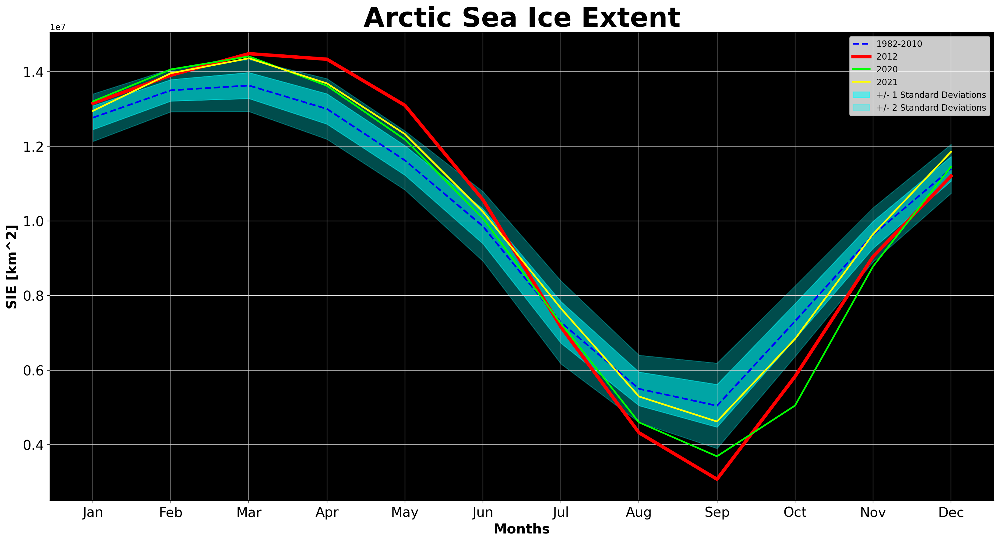

In [26]:
fig, ax = plt.subplots(figsize=(20,10))

ax.plot(arctic_time_slice['month'],arctic_time_slice, linewidth=2, label= '1982-2010', color='blue',linestyle='--')
ax.plot(arctic_time_slice_2012['month'],arctic_time_slice_2012, linewidth=4, label= '2012', color='red')
ax.plot(arctic_time_slice_2020['month'],arctic_time_slice_2020, linewidth=2, label= '2020', color='lime')
ax.plot(arctic_time_slice_2021['month'],arctic_time_slice_2021, linewidth=2, label= '2021', color='yellow')

ax.fill_between(arctic_time_slice['month'], arctic_time_slice +arctic_std_1982_2010,
                arctic_time_slice-arctic_std_1982_2010, 
                label='+/- 1 Standard Deviations',alpha=0.5, color='cyan')

ax.fill_between(arctic_time_slice['month'], arctic_time_slice+(2*arctic_std_1982_2010),
                arctic_time_slice-(2*arctic_std_1982_2010), 
                label='+/- 2 Standard Deviations',alpha=0.3, color='cyan')

ax.set_title('Arctic Sea Ice Extent',fontsize=32,fontweight='bold')
ax.set_xlabel('Months',fontsize=16,fontweight='bold')
ax.xaxis.set_ticks([1, 2, 3, 4, 5, 6, 7,  8, 9, 10, 11, 12],
              ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

ax.set_ylabel('SIE [km^2]',fontsize=16,fontweight='bold')
ax.tick_params(axis='both', which='major', labelsize=16)

plt.legend()
plt.grid(color='lightgrey')
ax.set_facecolor('black')

**Figure 7.** Average Arctic sea ice extent throughout various years measured in millions of km^2. Sea ice extent was calculated using sea ice concentration and grid cell area from the NOAA OI SST V2 High-Resolution Dataset that captured observations from September 1981 to September 2023 on a 1/4-degree global grid (25 km).

Text(0.5, 1.0, 'Antarctic Sea Ice Concentration at its Maximum')

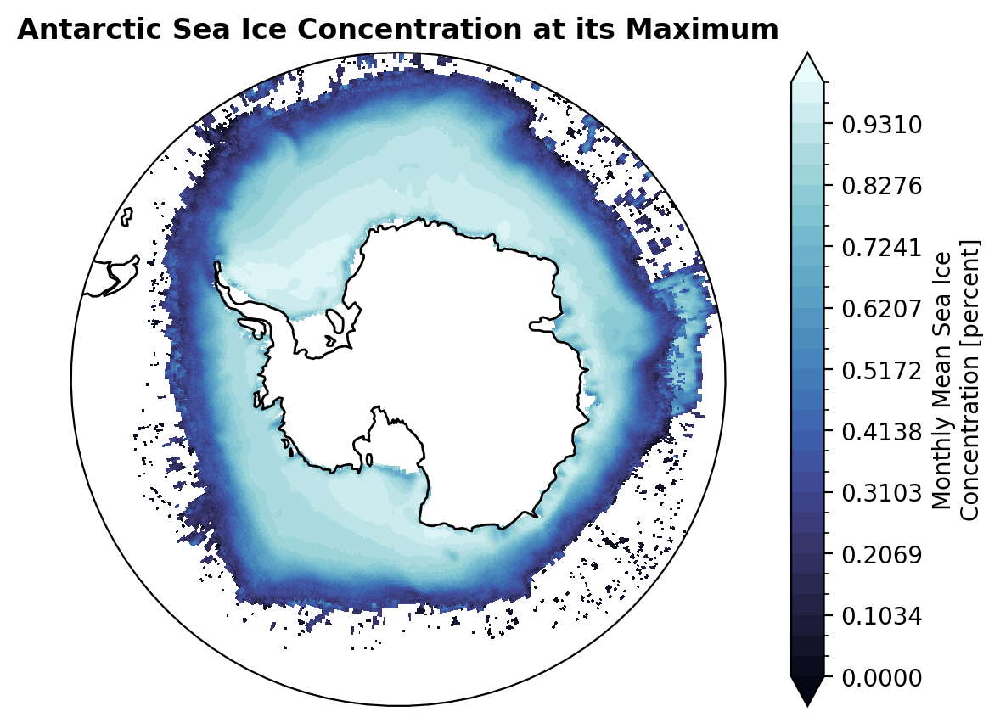

In [20]:
#antarctic sea ice concentration is at its maximum in September 
ant_months = seaice_observations.icec.groupby('time.month').mean(dim='time')
ant_max=ant_months.sel(month=9)

South_Polar(ant_max,0,1,cmap=cmocean.cm.ice)
plt.title('Antarctic Sea Ice Concentration at its Maximum', fontweight='bold')

**Figure 8.** Average Antarctic sea ice concentration from 1981-2023 at its maximum during September. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Antarctic Sea Ice Concentration at its Minimum')

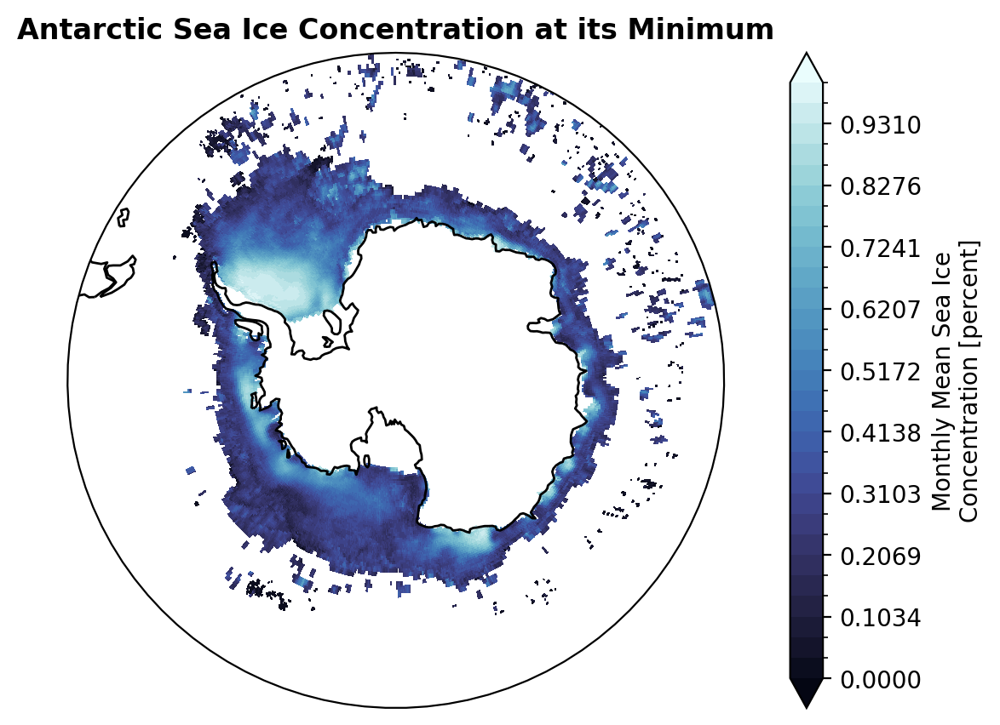

In [21]:
#antarctic sea ice concentration is at its minimum in February 
ant_months = seaice_observations.icec.groupby('time.month').mean(dim='time')
ant_minimum=ant_months.sel(month=2)

South_Polar(ant_minimum,0,1,cmap=cmocean.cm.ice)
plt.title('Antarctic Sea Ice Concentration at its Minimum', fontweight='bold')

**Figure 9.** Average Antarctic sea ice concentration from 1981-2023 at its minimum during February. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Arctic Sea Ice Concentration at its Maximum')

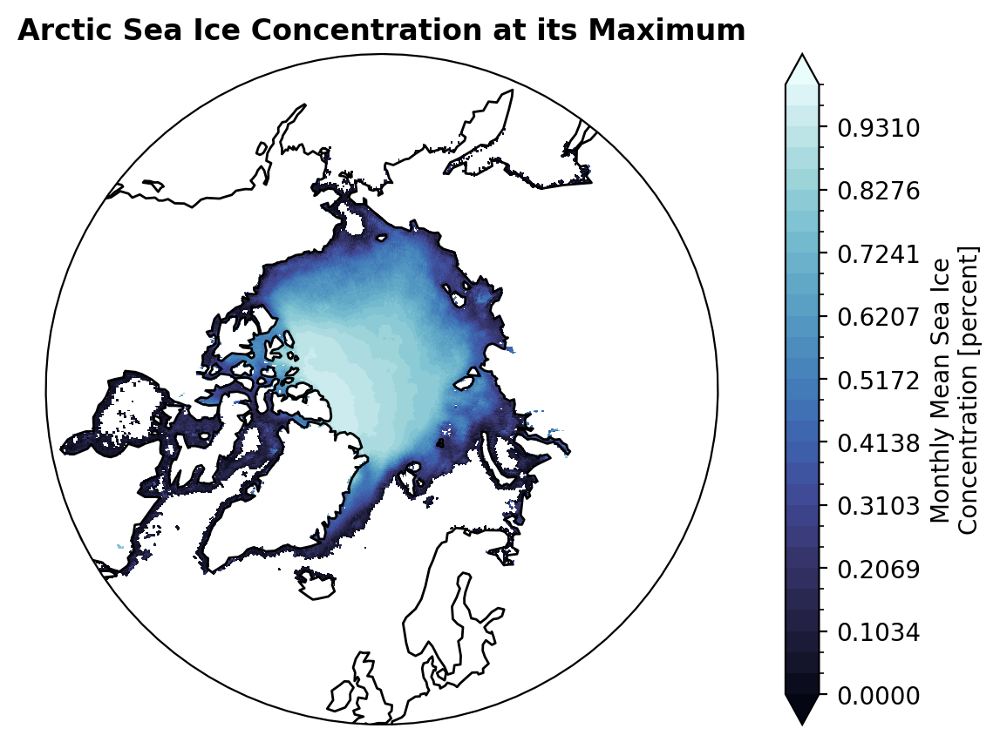

In [22]:
#arctic sea ice concentration is at its maximum in September 
arctic_months = seaice_observations.icec.groupby('time.month').mean(dim='time')
arctic_max=arctic_months.sel(month=9)

North_Polar(ant_max,0,1,cmap=cmocean.cm.ice)
plt.title('Arctic Sea Ice Concentration at its Maximum', fontweight='bold')

**Figure 10.** Average Arctic sea ice concentration from 1981-2023 at its maximum during September. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

Text(0.5, 1.0, 'Arctic Sea Ice Concentration at its Minimum')

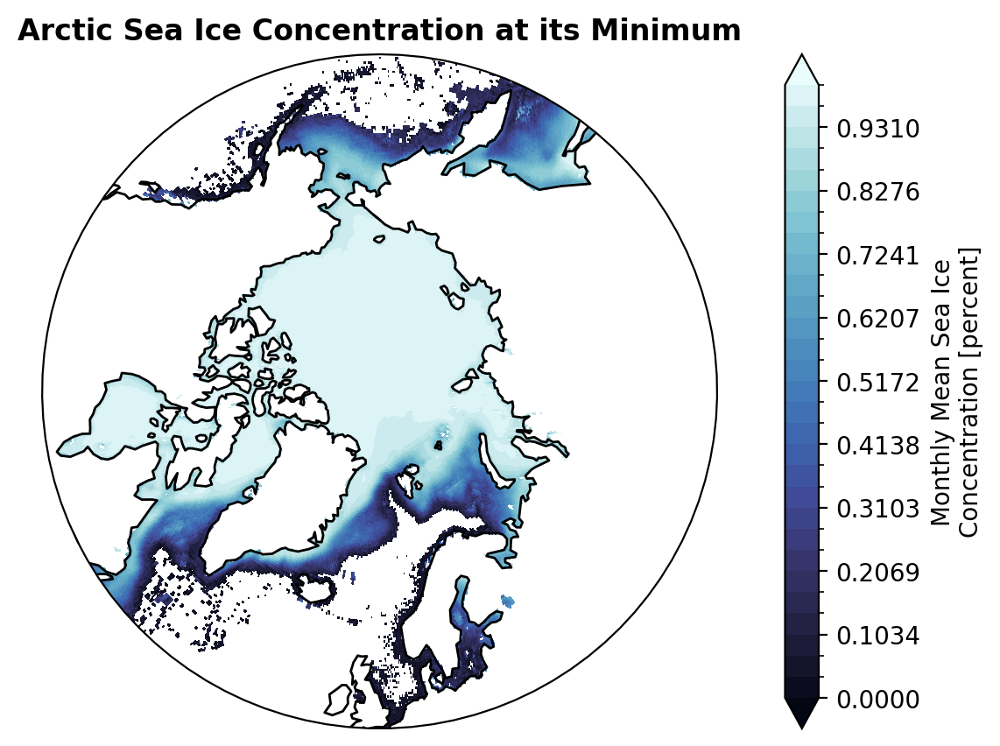

In [23]:
#arctic sea ice concentration is at its minimum in March 
arctic_months = seaice_observations.icec.groupby('time.month').mean(dim='time')
arctic_minimum=arctic_months.sel(month=3)

North_Polar(ant_minimum,0,1,cmap=cmocean.cm.ice)
plt.title('Arctic Sea Ice Concentration at its Minimum', fontweight='bold')

**Figure 11.** Average Arctic sea ice concentration from 1981-2023 at its minimum during March. Sea ice concentration from the NOAA OI SST V2 High-Resolution Dataset from September 1981 to September 2023 on a 1/4-degree global grid (25 km). Sea ice units are in fractional coverage. 0 = no ice and 1 = full grid cell coverage.

---

# SST OBSERVATIONS 

## datasets
SST from NOAA OI January 1993 to December 2022 on a 1-degree global grid (100km). NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

Grid cell area provided on the same grid as sea ice observations.
Units: 0 over land, 1 over ocean. ocean.

In [3]:
## Load a dataset of SST from OISST and assign to a variable called SST_OISST:
ees_climate_dir = 'C:/Users/TU_Climate24_Student/Desktop/ees_climate/'
SST_OISST = xr.open_dataset(ees_climate_dir+'3_unit_woolslayer/data/sst.oisst.mon.mean.1993_2022.nc',
                           use_cftime=True)
                           ### this use_cftime=True allows Xarray to interpret time coords as calendar.

## load in a dataset that contains a land-sea mask:
OISST_landsea_mask = xr.open_dataset(ees_climate_dir+'3_unit_woolslayer/data/lsmask.nc')

In [11]:
SST_OISST

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 360, time: 360)
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.0 1.0 2.0 3.0 4.0 ... 355.0 356.0 357.0 358.0 359.0
  * time     (time) object 1993-01-01 00:00:00 ... 2022-12-01 00:00:00
Data variables:
    sst      (time, lat, lon) float32 ...
Attributes:
    CDI:            Climate Data Interface version 1.9.10 (https://mpimet.mpg...
    source:         NOAA/NCEI https://www.ncei.noaa.gov/data/sea-surface-temp...
    institution:    NOAA/National Centers for Environmental Information
    Conventions:    CF-1.5
    title:          NOAA/NCEI 1/4 Degree Daily Optimum Interpolation Sea Surf...
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Daily Optimum Interpolation Sea Surface Temperature
    version:        Version 2.1
    comment:        Reynolds, et al.(2007) Daily High-Resolution-Blended Anal...
    CDO:            Climate Data Operators version 1.9.10 (https://mpimet.mpg...
    history:        Tue Aug  8 15:12:26 2023: ncks -d time,4, /scratch/csmith...
    NCO:            netCDF Operators version 4.8.1 (Homepage = http://nco.sf....

In [12]:
OISST_landsea_mask

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 360)
Coordinates:
  * lat      (lat) float32 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
    time     datetime64[ns] ...
  * lon      (lon) float32 0.0 1.0 2.0 3.0 4.0 ... 355.0 356.0 357.0 358.0 359.0
Data variables:
    mask     (lat, lon) float32 ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Created 10/2002 by RHS
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Optimum Interpolation (OI) SST V2
    source_url:     http://www.emc.ncep.noaa.gov/research/cmb/sst_analysis/

In [13]:
#extracting sea surface temperature (SST) array
SST=SST_OISST.sst

In [14]:
# The following function is used to create weights for the Earths grid space.
import warnings 

def standard_grid_cell_area(lat, lon, rE=6371.0e3):
    """ computes the cell area for a standard spherical grid """

    dLat = lat[1] - lat[0]
    dLon = lon[1] - lon[0]
    area = np.empty((len(lat), len(lon)))
    for j in range(0, len(lat)):
        for i in range(0, len(lon)):
            lon1 = lon[i] + dLon / 2
            lon0 = lon[i] - dLon / 2
            lat1 = lat[j] + dLat / 2
            lat0 = lat[j] - dLat / 2
            area[j, i] = (
                (np.pi / 180.0)
                * rE
                * rE
                * np.abs(np.sin(np.radians(lat0)) - np.sin(np.radians(lat1)))
                * np.abs(lon0 - lon1)
            )
    return area

In [15]:
lat_sst = SST_OISST.coords['lat'].values #1-D numpy array of model's latitude values
lon_sst = SST_OISST.coords['lon'].values #1-D numpy array of model's longitude values

# make sure to replace the name of the data array if you chose a 
# different name and use the appropriate coordinate names within the ['']
# based on the coordinates of lat / lon in your dataset.

# Pass the arrays to the standard_grid_cell_area function
areacell = standard_grid_cell_area(lat_sst,lon_sst)  

# The areacella_xarray function outputs a numpy array. Convert this back into 
# and xarray DataArray for further use. If this is a field you will be using 
# often. You may wish to save this newly created DataArray as a Dataset and save 
# as a netcdf file.

# here we assign dimensions and coordinates that are the same as our original SST array:

areacell_xarray = xr.DataArray(areacell,dims=({'lat':180, 'lon':360}),\
                                                coords=(SST_OISST.coords['lat'],\
                                                        SST_OISST.coords['lon']))

In [16]:
#creating the area weights
weights = areacell_xarray*OISST_landsea_mask.mask

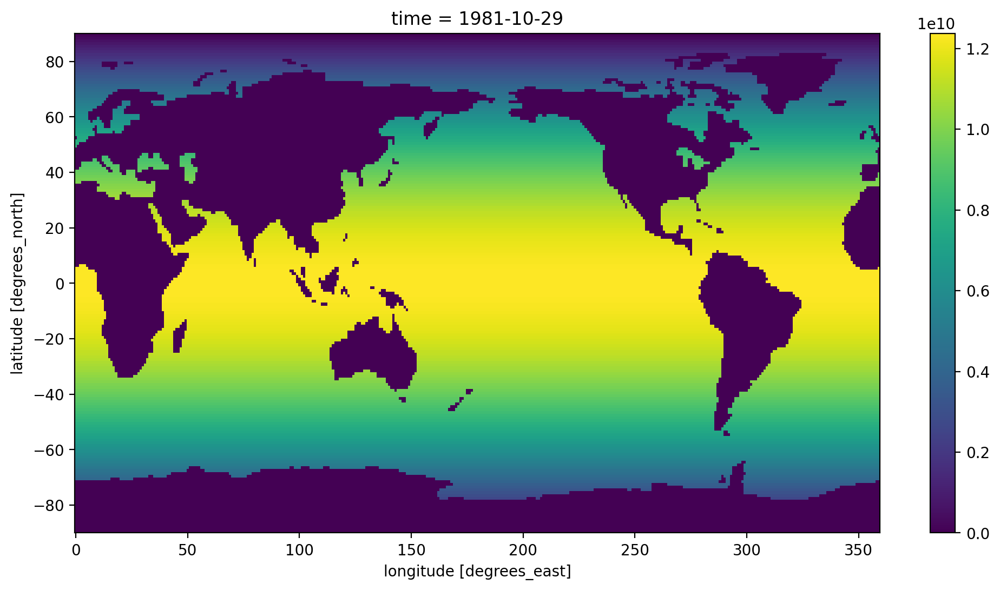

In [17]:
#by applying the land mask, there is grid cell area over the ocean but has values of zero over land
weights.plot()

In [18]:
#averaging lat and lon out so there is only time left for our time series
weighted_average_SST = SST.weighted(weights).mean(['lat', 'lon']) 

Text(0.5, 1.0, 'Area - Weighted Average Sea Surface Temperature')

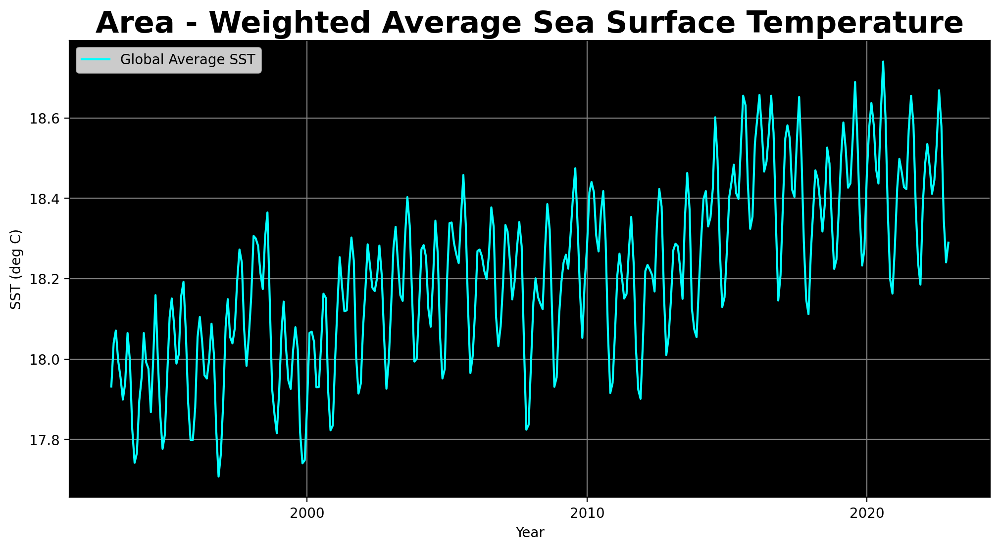

In [11]:
fig, ax0 = plt.subplots()

weighted_average_SST.plot(ax=ax0, color='cyan', 
                          label='Global Average SST')

ax0.grid(color='grey')

ax0.legend()
ax0.set_ylabel('SST (deg C)')
ax0.set_xlabel('Year')

ax0.set_facecolor('black')

plt.title('Area - Weighted Average Sea Surface Temperature', fontweight='bold',fontsize=22)

**Figure 12.** Global average area-weighted sea surface temperature in degrees celsius from 1993-2022. NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/.](https://psl.noaa.gov/)

In [35]:
#slicing the weights for the polar latitudes
arctic_sst_slice=SST.sel(lat=slice(55,90)).weighted(weights).mean(['lat', 'lon'])
ant_sst_slice=SST.sel(lat=slice(-90, -55)).weighted(weights).mean(['lat', 'lon'])

Text(0.5, 1.0, 'Arctic vs Antarctica Area - Weighted Average SST')

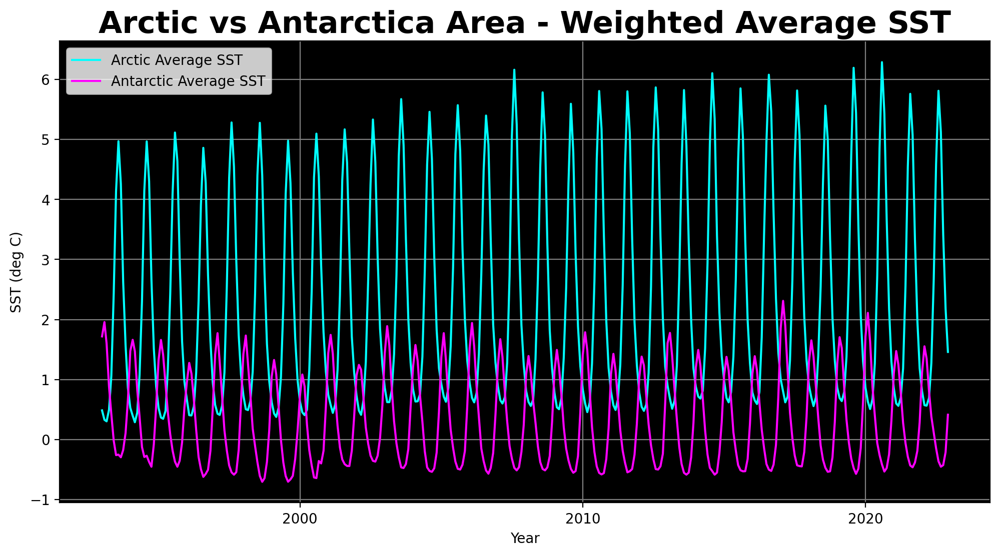

In [229]:
fig, ax0 = plt.subplots()

arctic_sst_slice.plot(ax=ax0, color='cyan', 
                          label='Arctic Average SST')

ant_sst_slice.plot(ax=ax0, color='fuchsia', 
                          label='Antarctic Average SST')

ax0.grid(color='grey')

ax0.legend()
ax0.set_ylabel('SST (deg C)')
ax0.set_xlabel('Year')

ax0.set_facecolor('black')

plt.title('Arctic vs Antarctica Area - Weighted Average SST', fontweight='bold',fontsize=22)

**Figure 13.** 'Arctic vs Antarctica Area - Weighted Average sea surface temperatures from 1993-2022. Sea surface temperatures from NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

### global seasonal time-averaged (1993 to 2022) SST.

In [33]:
#group by seasons
seasonal_SST=SST.groupby('time.season').mean(dim='time')
winter=seasonal_SST.sel(season='DJF')
spring=seasonal_SST.sel(season='MAM')
summer=seasonal_SST.sel(season='JJA')
fall=seasonal_SST.sel(season='SON')

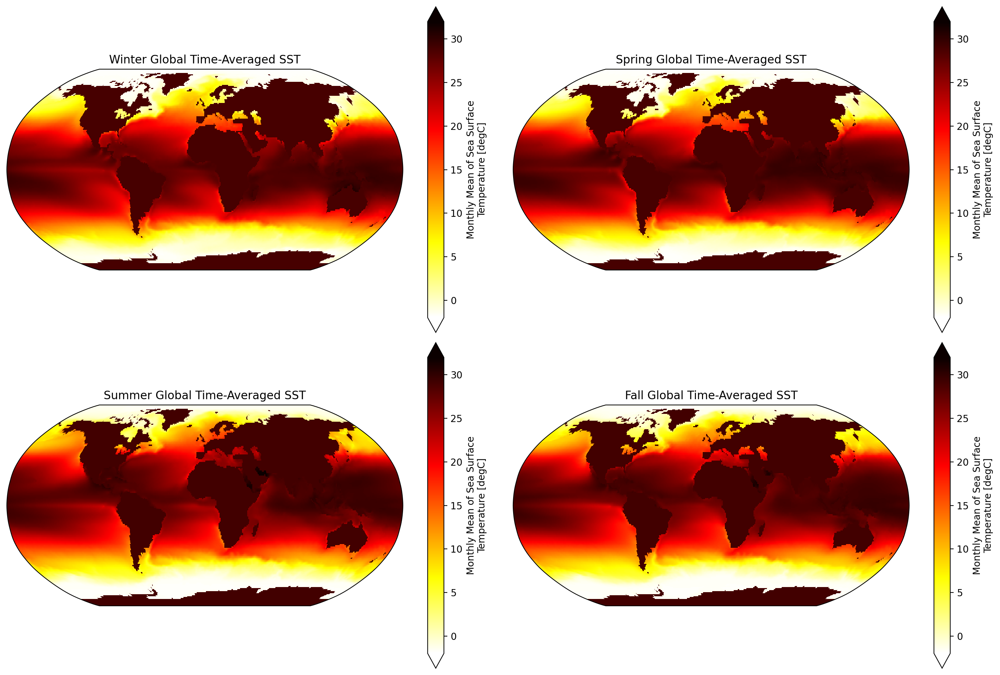

In [27]:
subplot_kws=dict(projection=ccrs.Robinson(), facecolor='grey')

fig, (ax)=plt.subplots(ncols=2,nrows=2, figsize=(15,10),subplot_kw=subplot_kws)
winter.plot(ax=ax[0,0], cmap='hot_r', vmin=-2,vmax=32, 
            extend='both',transform=ccrs.PlateCarree())
spring.plot(ax=ax[0,1], cmap='hot_r', vmin=-2,vmax=32, 
            extend='both',transform=ccrs.PlateCarree())
summer.plot(ax=ax[1,0], cmap='hot_r', vmin=-2,vmax=32, 
            extend='both',transform=ccrs.PlateCarree())
fall.plot(ax=ax[1,1], cmap='hot_r', vmin=-2,vmax=32, 
          extend='both',transform=ccrs.PlateCarree())

ax[0,0].set_title('Winter Global Time-Averaged SST')
ax[0,1].set_title('Spring Global Time-Averaged SST')
ax[1,0].set_title('Summer Global Time-Averaged SST')
ax[1,1].set_title('Fall Global Time-Averaged SST')

plt.tight_layout()

**Figure14.** Seasonal SST averages on a global scale from a 30-year climatological average from 1993-2022. Sea surface temperatures from NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

# Anomaly between the first and last 5 years of the climate normal

In [23]:
#slicing time to look at the first five years and the last five years 
SST_2018_2022=SST.sel(time=slice('2018-01-01','2022-12-31'))
SST_1993_1997=SST.sel(time=slice('1993-01-01','1997-12-31'))

In [30]:
#creating an SST average over the years
SST_2018_2022_mean=SST_2018_2022.mean(dim='time')
SST_1993_1997_mean=SST_1993_1997.mean(dim='time')

In [32]:
#calculating anomaly
anomaly=SST_2018_2022_mean-SST_1993_1997_mean

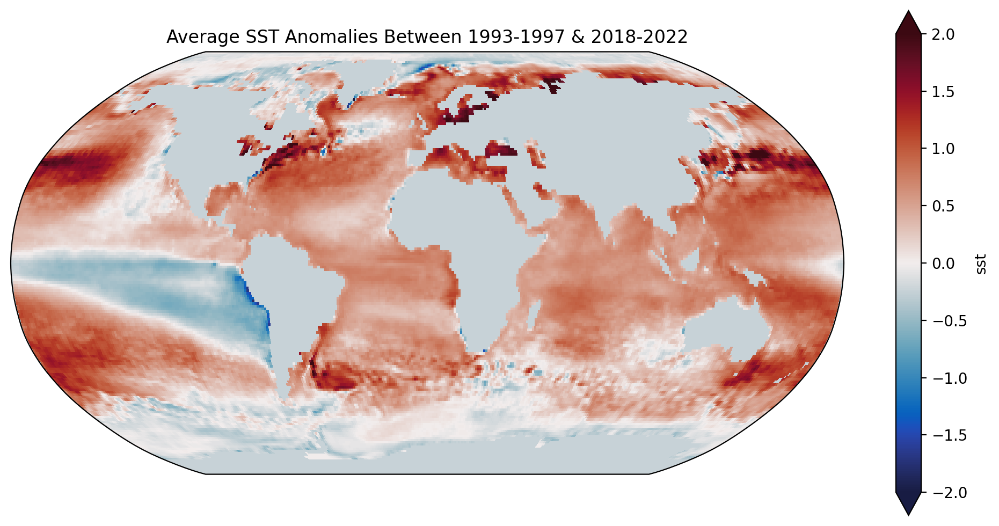

In [252]:
subplot_kws=dict(projection=ccrs.Robinson(),
                 facecolor='grey')

fig, (ax)=plt.subplots(ncols=1,nrows=1, figsize=(10,5),subplot_kw=subplot_kws)
anomaly.plot(ax=ax, cmap=cmocean.cm.balance, vmin=-2,vmax=2, 
                extend='both',transform=ccrs.PlateCarree())

ax.set_title('Average SST Anomalies Between 1993-1997 & 2018-2022')
plt.tight_layout()

**Figure 15.** Average SST anomalies between the first five years (1993-1997) of the 30-year climate normal and the last five (2018-2022). Anomalies were calculated using SST information from NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

There is a negative anomaly occurring off the west coast of Africa while almost everywhere else is experiencing positive anomalies, meaning that average SST has risen since the beginning of the climate normal, 1993. The northern hemisphere appears to have greater temperature anomalies than the southern hemisphere as well. This is noticeable off the west coast of North America and east of Asia.

### Computing seasonal anomalies for the same time periods

In [33]:
#creating seasonal slices
seasonal_SST_2018_2022=SST_2018_2022.groupby('time.season').mean(dim='time')
seasonal_SST_1993_1997=SST_1993_1997.groupby('time.season').mean(dim='time')

In [34]:
#seasonal averages for 2018-2022
winter_2018_2022=seasonal_SST_2018_2022.sel(season='DJF')
spring_2018_2022=seasonal_SST_2018_2022.sel(season='MAM')
summer_2018_2022=seasonal_SST_2018_2022.sel(season='JJA')
fall_2018_2022=seasonal_SST_2018_2022.sel(season='SON')

#seasonal averages for 1993-1997
winter_1993_1997=seasonal_SST_1993_1997.sel(season='DJF')
spring_1993_1997=seasonal_SST_1993_1997.sel(season='MAM')
summer_1993_1997=seasonal_SST_1993_1997.sel(season='JJA')
fall_1993_1997=seasonal_SST_1993_1997.sel(season='SON')

In [35]:
#calculating anomalies
winter_anomaly=winter_2018_2022-winter_1993_1997
spring_anomaly=spring_2018_2022-spring_1993_1997
summer_anomaly=summer_2018_2022-summer_1993_1997
fall_anomaly=fall_2018_2022-fall_1993_1997

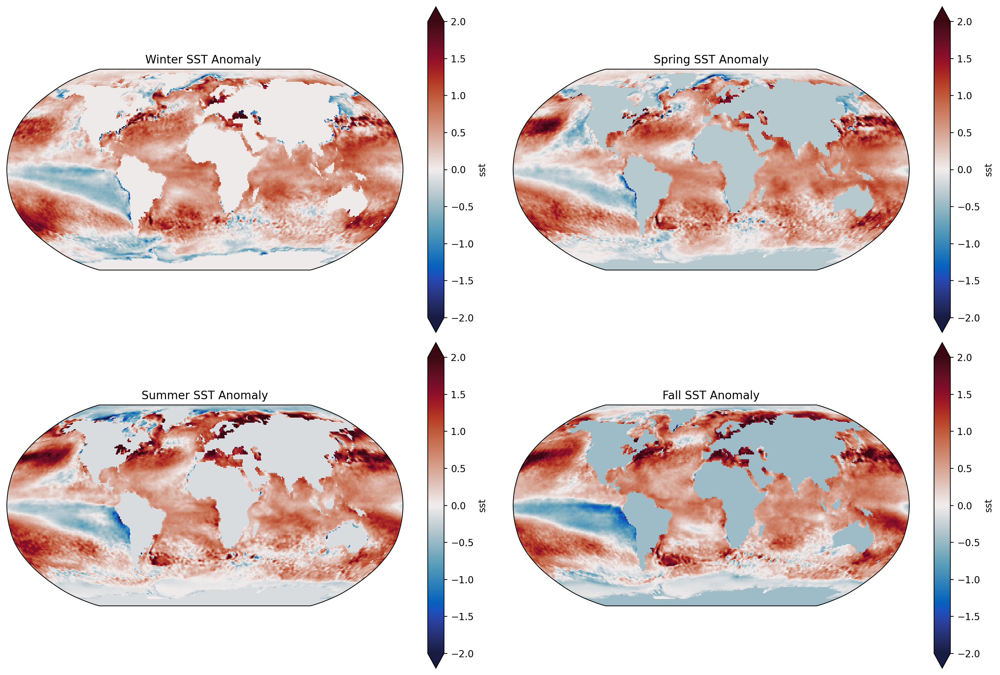

In [269]:
subplot_kws=dict(projection=ccrs.Robinson(),
                 facecolor='grey')

fig, (ax)=plt.subplots(ncols=2,nrows=2, figsize=(15,10),subplot_kw=subplot_kws)
winter_anomaly.plot(ax=ax[0,0], cmap=cmocean.cm.balance, vmin=-2,vmax=2, 
                 extend='both',transform=ccrs.PlateCarree())
spring_anomaly.plot(ax=ax[0,1], cmap=cmocean.cm.balance, vmin=-2,vmax=2, 
                 extend='both',transform=ccrs.PlateCarree())
summer_anomaly.plot(ax=ax[1,0], cmap=cmocean.cm.balance, vmin=-2,vmax=2, 
                 extend='both',transform=ccrs.PlateCarree())
fall_anomaly.plot(ax=ax[1,1], cmap=cmocean.cm.balance, vmin=-2,vmax=2, 
               extend='both',transform=ccrs.PlateCarree())

ax[0,0].set_title('Winter SST Anomaly ')
ax[0,1].set_title('Spring SST Anomaly')
ax[1,0].set_title('Summer SST Anomaly')
ax[1,1].set_title('Fall SST Anomaly')

plt.tight_layout()

**Figure 16.** Seasonal averages of SST anomalies between the first five years (1993-1997) of the 30-year climate normal and the last five (2018-2022). Anomalies were calculated using SST information from NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

Fall looks like it's experiencing the most extreme anomalies, noticeably in the Arctic, west coast of North America, and East of Asia. 

### Mean SST Anomalies in 2022 compared to the 1993 to 2022 climatological average

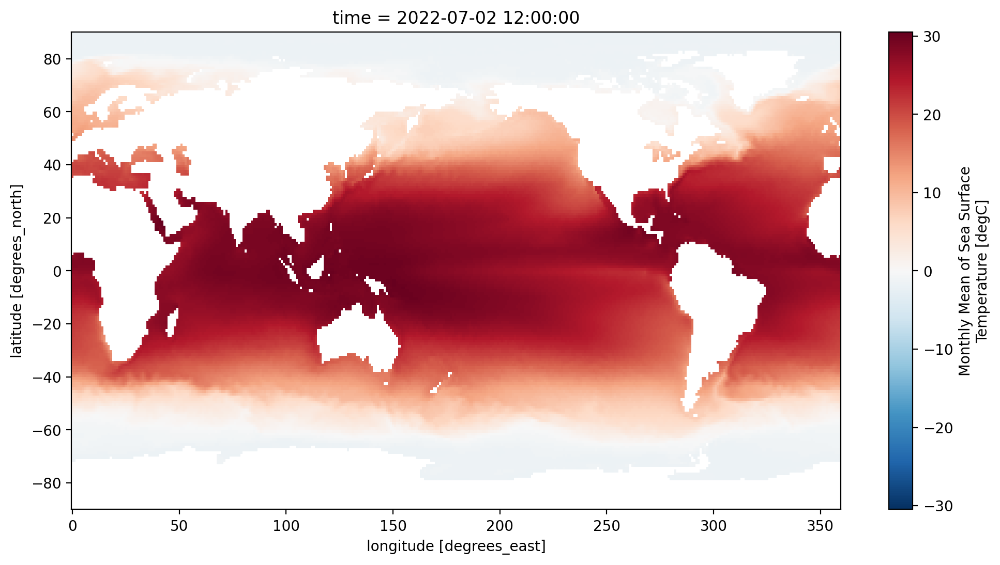

In [34]:
#looking at 2022 and its average SST
SST_2022.plot()

Text(0.5, 1.0, 'Anomaly between 2022 Annual-Mean SST and the \nAverage Annual SST from 1993-2022 Climatological Average')

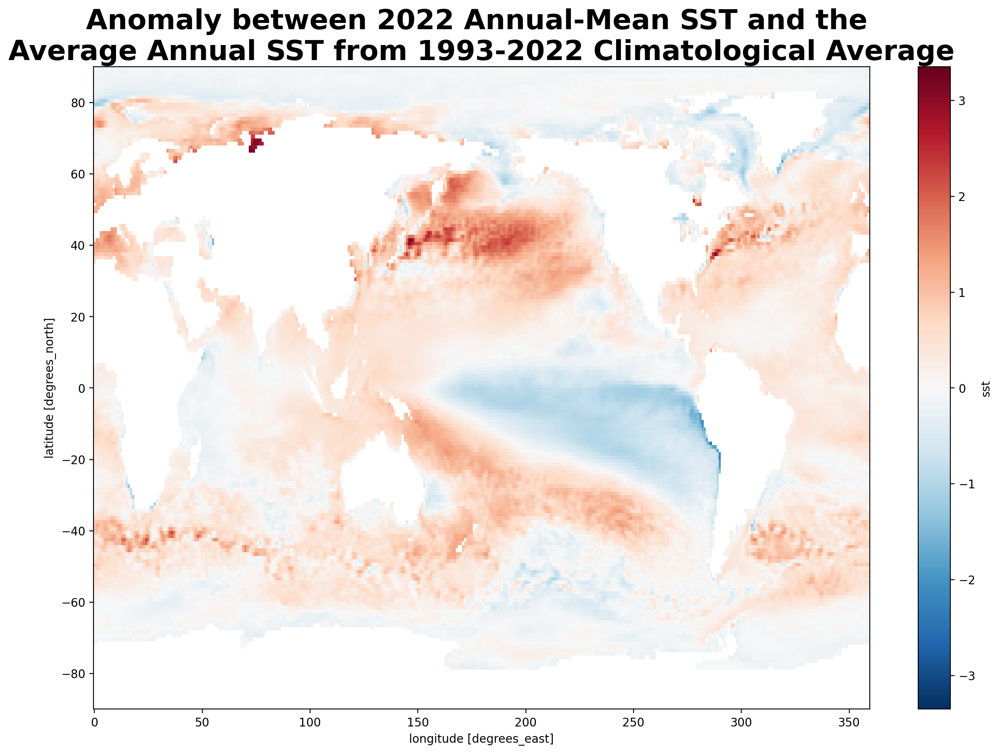

In [30]:
# slicing the year 2022 to compare it to the 30 year climate normal
SST_2022= SST_annual.sel(time='2022-07-02')

#averaging the time from the 30 year climate normal period
climatological_average=SST.mean(dim='time')


#calculating anomaly
climatological_anomaly= SST_2022-climatological_average


#plotting
climatological_anomaly.plot(figsize=(15,10))
plt.title('Anomaly between 2022 Annual-Mean SST and the \nAverage Annual SST from 1993-2022 Climatological Average', 
          fontweight='bold',fontsize=24)

**Figure 17.** The anomaly between 2022 and the 30-year climatological average SST. Anomalies were calculated using SST information from NOAA OI SST V2 High-Resolution Dataset data (Huang et al., 2021) provided by the NOAA PSL, Boulder, Colorado, USA, from their website at [https://psl.noaa.gov/](https://psl.noaa.gov/).

2022 seems like it was very warm, with anomalies much higher in the northern hemisphere once again. 

---

# <span style="color:dodgerblue"> SSP5-8.5 Scenario</span> 
Let's take a look into the SSP5-8.5 scenario since we look at results simulated by its conditions. 

The SSP5-8.5 scenario is one of five shared socioeconomic pathways (SSPs). SSPs were developed by a team of the best climate scientists from around the world. The goal of SSPs is to quantify the results of various societal decisions that will impact GHG emissions and outline a plan to mitigate them. The Paris Agreement was ratified in 2015 and set the goal to limit anthropogenic warming to 2 degrees celsius above preindustrial temperatures. The SSPs are a better model of what emissions will look like since they incorporate information about population, economic growth, education, urbanization, and the rate of technological advancements([Carbon Brief](https://www.carbonbrief.org/explainer-how-shared-socioeconomic-pathways-explore-future-climate-change/)). The SSP5 scenario depicts a future where human development thrives on a fossil fuel-based economy. It is essentially the outlook if we continue on the path we are on now. Policy is excluded from these pathways since the goal is for each country to create their own policy based on its cultural and economic status. 

The SSP5 scenario is a world that has unconstrained economic growth and energy use. This would lead to high challenges to mitigation but low challenges to adaptations. This means that we wouldn't need to adapt much of our behavior but as a result, we need to implement strategies that would mitigate GHG emissions. There is confidence in this pathway that rapid development of education and technology will produce sustainable solutions to offset the fossil fuel-driven advancements. Local environmental problems are successfully managed in this scenario as well. However, there is an environmental tradeoff here. Emissions in SSP5 rise too high and fall too slowly to meet the Paris Agreement goal without major reductions of negative emissions. Bioenergy with carbon capture and storage (BECCS) is the main form of carbon mitigation that scientists are pushing for. All SSPs have some implementation of BECCS to some degree. SSP5 requires the highest use of BECCS to reach carbon negative emissions needed to reach the Paris Agreement goal. BECCS is considered to be a stand-in solution for now but it is hoped that advanced technology will engineer new ways that would otherwise better optimize carbon capture and storage. 

Although the ideal SSP would be SSP1(sustainability), it is unrealistic for many countries to achieve without major cuts in energy consumption. This would require the global population to peak mid-century which largely also seems unrealistic. SSP5 is the scenario that seems most realistic but as increased extreme weather events continue to occur and clean water starts to dissipate, I fear that we may shift to SSP3, which is regional rivalry or a rocky road. It seems only natural for countries to put their people first as resources start to fall short and disasters impact the strength of their economies. The characteristics associated with SSP3 don't seem too far off from the reality of how humans react when they are forced into survival mode. Little consideration is given to the environment and it quickly becomes every man for themselves. I think about grocery stores when natural disasters are near. Empty shelves, with people buying in bulk, sometimes even fighting for basic needs. We saw Florida gas stations run out of fuel as thousands tried to flee from Hurricane Milton. We saw airlines increase their prices so many lower or middle-class Americans could not afford to leave by plane either. I think there has been great progress and increased concern for the environment over the years which makes me want to believe that we are on track with SSP5 but mitigation efforts are still falling short. Carbon removal strategies are still heavily underdeveloped and not as efficient as they need to be to reach the goals of the Paris Agreement. I want to believe there is still hope to change the outlook of the future but when push comes to shove, I only see a desolate future.

*All information has been collected and adapted from [Carbon Brief](https://www.carbonbrief.org/explainer-how-shared-socioeconomic-pathways-explore-future-climate-change/) and [climatescenarios.org](https://climatescenarios.org/primer/socioeconomic-development/).*

![](https://climatescenarios.org/primer/_nuxt/img/208de77.jpg)

image from [climatescenarios.org](https://climatescenarios.org/primer/socioeconomic-development/)

---

# CLIMATE MODEL PROJECTION OF SEAC ICE CONCENTRATION


## datasets
Monthly simulated SIC (0-100%) output from GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL). This data contributed to the sixth phase of the Coupled Model Intercomparison Project (CMIP6) and was made available via Google Cloud:[https://console.cloud.google.com/marketplace/product/noaa-public/cmip6](https://console.cloud.google.com/marketplace/product/noaa-public/cmip6)


gdfl_esm4_cell_area is provided in zarr format via google cloud. Ocean grid cell area provided on the same grid as the SIC model output.
Units: m^2

## new polar projections to account for distortion in the model data in the north pole .... this is because climate models actually have 3 poles .... a "tri-polar" grid, due to computational difficulties with solving equations converging on a single point.

In [44]:
def North_Polar_Model(array,vmin,vmax,cmap):
    subplot_kws = dict(projection=ccrs.NorthPolarStereo()) 
    fig, ax = plt.subplots(figsize=[10, 5],subplot_kw=subplot_kws)
    
    array.plot(x='geolon', y='geolat',ax=ax,
               transform =ccrs.PlateCarree(),
               vmin=vmin,
               vmax=vmax,
               extend='both',
               cmap=cmap,levels=30)

    # Limit the map to -50 degrees latitude and below.
    ax.set_extent([-180, 180, 50, 90], ccrs.PlateCarree())
    
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    ax.coastlines()

In [45]:
def South_Polar_Model(array,vmin,vmax,cmap):
    subplot_kws = dict(projection=ccrs.SouthPolarStereo()) 
    fig, ax = plt.subplots(figsize=[10, 5],subplot_kw=subplot_kws)
    
    array.plot(x='geolon', y='geolat',ax=ax,
               transform =ccrs.PlateCarree(),
               vmin=vmin,
               vmax=vmax,
               extend='both',
               cmap=cmap, levels=30)

    # Limit the map to -50 degrees latitude and below.
    ax.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
    
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    ax.coastlines()

In [49]:
#reading in the aata
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')

In [50]:
#sea ice concentration data
gfdl_esm4_sea_ice_data = df.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'SImon' & \
    variable_id == 'siconc' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gn' & \
    member_id == 'r1i1p1f1'"
)

# this only needs to be created once
gcs = gcsfs.GCSFileSystem(token='anon')
# get the path to a specific zarr store (the first one from the dataframe above)
zstore_siconc = gfdl_esm4_sea_ice_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_siconc = gcs.get_mapper(zstore_siconc)
# open the dataset using xarray and zarr
gfdl_esm4_ssp585_siconc = xr.open_zarr(mapper_siconc, 
                                         consolidated=True,use_cftime=True
                                         ).siconc.rename({'y':'latitude',
                                                             'x':'longitude',
                                                             'lat':'geolat',
                                                             'lon':'geolon'})
gfdl_esm4_ssp585_siconc

<xarray.DataArray 'siconc' (time: 1032, latitude: 576, longitude: 720)>
dask.array<open_dataset-siconc, shape=(1032, 576, 720), dtype=float32, chunksize=(600, 576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * time       (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    long_name:      Sea Ice Area Fraction (Ocean Grid)
    original_name:  siconc
    standard_name:  sea_ice_area_fraction
    units:          %

In [51]:
#grid cell area data
gfdl_esm4_cell_area_data = df.query(
    "activity_id=='CMIP' & \
    table_id == 'Ofx' & \
    variable_id == 'areacello' & \
    experiment_id == 'piControl' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gn'")

# get the path to a specific zarr store (the first one from the dataframe above)
zstore_area = gfdl_esm4_cell_area_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_area = gcs.get_mapper(zstore_area)
# open the dataset using xarray and zarr
gfdl_esm4_cell_area = xr.open_zarr(mapper_area, 
                                         consolidated=True,
                                         ).areacello.rename({'y':'latitude',
                                                             'x':'longitude',
                                                             'lat':'geolat',
                                                             'lon':'geolon'})
gfdl_esm4_cell_area

<xarray.DataArray 'areacello' (latitude: 576, longitude: 720)>
dask.array<open_dataset-areacello, shape=(576, 720), dtype=float32, chunksize=(576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
Attributes:
    cell_methods:   area: sum
    long_name:      Grid-Cell Area
    original_name:  areacello
    standard_name:  cell_area
    units:          m2

In [52]:
#slicing time 
gfdl_sic_2014_2025=gfdl_esm4_ssp585_siconc.sel(time=slice('2014-01-16', '2025-12-16'))
gfdl_sic_2081_2100=gfdl_esm4_ssp585_siconc.sel(time=slice('2081-01-16', '2100-12-16'))

In [53]:
#anomaly time
gfdl_sic_2014_2025=gfdl_esm4_ssp585_siconc.sel(time=slice('2014-01-16', '2025-12-16'))
gfdl_sic_2081_2100=gfdl_esm4_ssp585_siconc.sel(time=slice('2081-01-16', '2100-12-16'))

In [54]:
#sea ice extent
extent_2014_2025=gfdl_sic_2014_2025*gfdl_esm4_cell_area
extent_2081_2100=gfdl_sic_2081_2100*gfdl_esm4_cell_area

In [55]:
#extent in km
arc_km_extent_2014_2025=(extent_2014_2025/1000000/1000000).sel(latitude=slice(50,90)).groupby('time.month').mean(dim='time')
arc_km_extent_2081_2100=(extent_2081_2100/1000000/1000000).sel(latitude=slice(50,90)).groupby('time.month').mean(dim='time')

ant_km_extent_2014_2025=(extent_2014_2025/1000000/1000000).sel(latitude=slice(-90,-50)).groupby('time.month').mean(dim='time')
ant_km_extent_2081_2100=(extent_2081_2100/1000000/1000000).sel(latitude=slice(-90,-50)).groupby('time.month').mean(dim='time')

In [56]:
#total extent
arc_total_sie_2014_2025=arc_km_extent_2014_2025.sum(dim=['latitude','longitude'])
arc_total_sie_2081_2100=arc_km_extent_2081_2100.sum(dim=['latitude','longitude'])

ant_total_sie_2014_2025=ant_km_extent_2014_2025.sum(dim=['latitude','longitude'])
ant_total_sie_2081_2100=ant_km_extent_2081_2100.sum(dim=['latitude','longitude'])

In [57]:
arctic_past=arc_total_sie_2014_2025
arctic_future=arc_total_sie_2081_2100

ant_past=ant_total_sie_2014_2025
ant_future=ant_total_sie_2081_2100

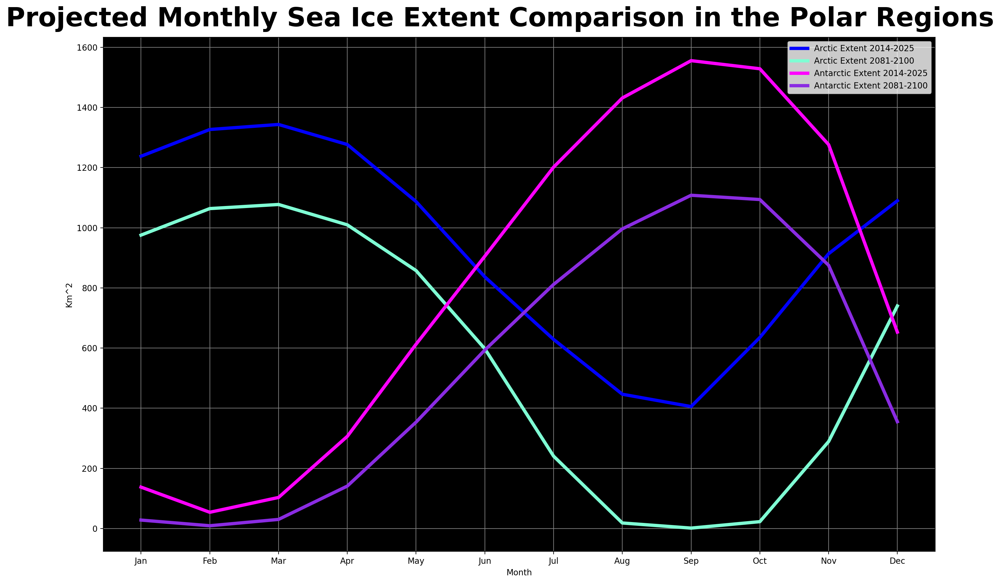

In [58]:
fig, (ax) = plt.subplots(nrows = 1, ncols = 1, figsize = (15, 10))

fig.suptitle('Projected Monthly Sea Ice Extent Comparison in the Polar Regions', fontsize=32,fontweight='bold')

ax.grid(color='grey')

ax.plot(arctic_past['month'], arctic_past, linewidth=4,label='Arctic Extent 2014-2025', color='blue')

ax.plot(arctic_future['month'], arctic_future, linewidth=4, label='Arctic Extent 2081-2100', color='aquamarine')

ax.plot(ant_past['month'], ant_past,linewidth=4, label='Antarctic Extent 2014-2025', color='fuchsia')

ax.plot(ant_future['month'], ant_future, linewidth=4, label='Antarctic Extent 2081-2100', color='blueviolet')

ax.xaxis.set_ticks([1, 2, 3, 4, 5, 6, 7,  8, 9, 10, 11, 12],
              ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
ax.legend()
ax.set_ylabel('Km^2')
ax.set_xlabel('Month')

ax.set_facecolor('black')

plt.tight_layout()

**Figure 18.** Projected sea ice extent comparison in the polar regions. Two periods of time were evaluated, 2014-2025 and 2081-2100. Sea ice concentrations that were used to calculate the extent were simulated by GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL). This data contributed to the sixth phase of the Coupled Model Intercomparison Project (CMIP6) and was made available via Google Cloud:[https://console.cloud.google.com/marketplace/product/noaa-public/cmip6](https://console.cloud.google.com/marketplace/product/noaa-public/cmip6)

Sea ice extent is declining in both the Arctic and Antarctic. Even though most of Arctic sea ice stays frozen in the summer, the amount lost is projected to increase between 2081-2100.

### Timeseries of the Arctic and Antarctic annual mean SIE from 2014 to 2100

#### Note that due to a bug in Xarray dealing with a NOLEAP calendar, you must convert the calendar to Gregorian prior to plotting ....

#### `data_array.convert_calendar('Gregorian').plot()`

In [59]:
gregorian=gfdl_esm4_ssp585_siconc.convert_calendar('Gregorian')

#grouping time by years
gfdl_sic_2014_2100=gregorian.groupby('time.year').mean(dim='time')
gfdl_sic_2014_2100

<xarray.DataArray 'siconc' (year: 86, latitude: 576, longitude: 720)>
dask.array<stack, shape=(86, 576, 720), dtype=float32, chunksize=(1, 576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
  * year       (year) int64 2015 2016 2017 2018 2019 ... 2097 2098 2099 2100
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    long_name:      Sea Ice Area Fraction (Ocean Grid)
    original_name:  siconc
    standard_name:  sea_ice_area_fraction
    units:          %

In [60]:
#sea ice extent
extent_2014_2100=gfdl_sic_2014_2100*gfdl_esm4_cell_area
#extent in km
arc_km_extent_2014_2100=(extent_2014_2100/1000000/1000000).sel(latitude=slice(50,90))
ant_km_extent_2014_2100=(extent_2014_2100/1000000/1000000).sel(latitude=slice(-90,-50))
#total extent
arc_total_sie_2014_2100=arc_km_extent_2014_2100.mean(dim=['latitude','longitude'])
ant_total_sie_2014_2100=ant_km_extent_2014_2100.mean(dim=['latitude','longitude'])

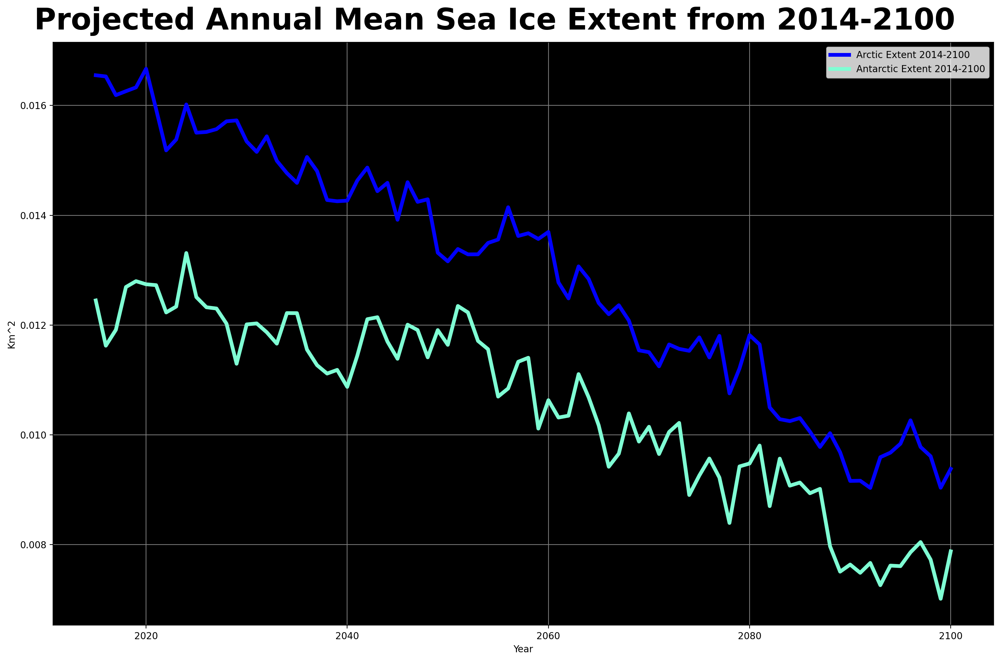

In [61]:
fig, (ax) = plt.subplots(nrows = 1, ncols = 1, figsize = (15, 10))

fig.suptitle('Projected Annual Mean Sea Ice Extent from 2014-2100 ', fontsize=32,fontweight='bold')

ax.grid(color='grey')

ax.plot(arc_total_sie_2014_2100['year'], arc_total_sie_2014_2100, linewidth=4,label='Arctic Extent 2014-2100', color='blue')

ax.plot(ant_total_sie_2014_2100['year'], ant_total_sie_2014_2100, linewidth=4, label='Antarctic Extent 2014-2100', color='aquamarine')

ax.legend()
ax.set_ylabel('Km^2')
ax.set_xlabel('Year')

ax.set_facecolor('black')

plt.tight_layout()

**Figure 19.**  Projected annual sea ice extent comparison in the polar regions from 2014-2100. Sea ice concentrations that were used to calculate the extent were simulated by GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL). This data contributed to the sixth phase of the Coupled Model Intercomparison Project (CMIP6) and was made available via Google Cloud:[https://console.cloud.google.com/marketplace/product/noaa-public/cmip6](https://console.cloud.google.com/marketplace/product/noaa-public/cmip6)

In [62]:
#Sea Ice concentration at the end of the century vs. the start

end=gfdl_esm4_ssp585_siconc.sel(time=slice('2100-01-16', '2100-12-16')).mean(dim='time')
start=gfdl_esm4_ssp585_siconc.sel(time=slice('2015-01-16', '2015-12-16')).mean(dim='time')

#calculating the difference
difference=end-start

Text(0.5, 1.0, 'Arctic Sea Ice Concentration Difference Between \nthe Last Year and First Year of the Century')

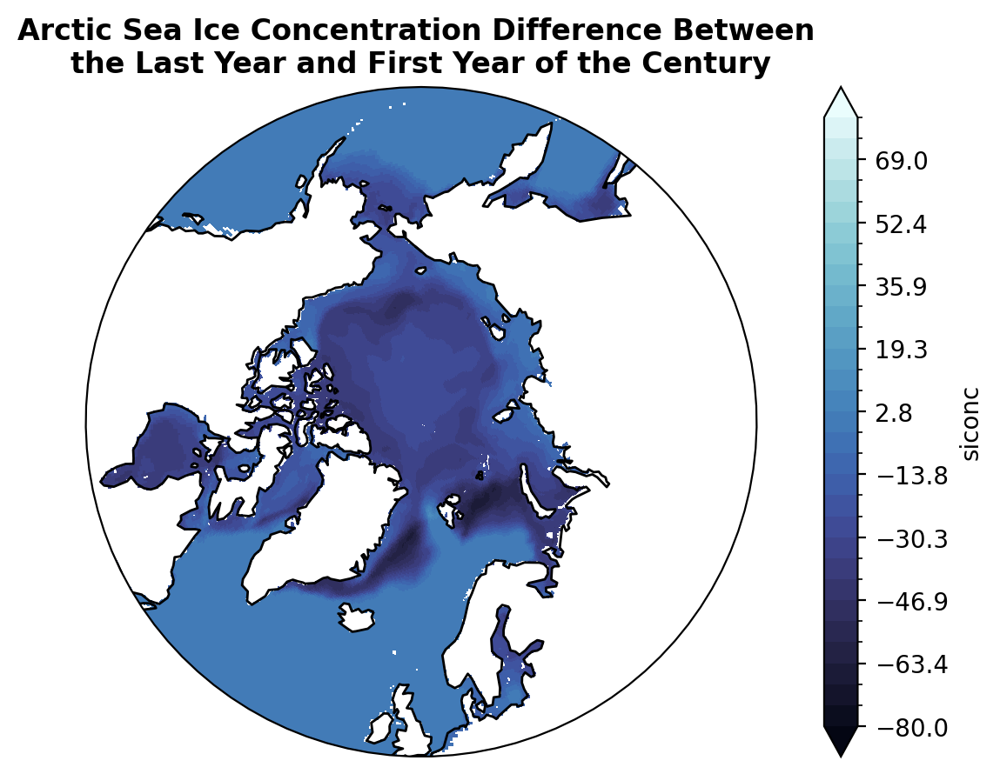

In [63]:
North_Polar_Model(difference, -80, 80, cmocean.cm.ice)
plt.title('Arctic Sea Ice Concentration Difference Between \nthe Last Year and First Year of the Century', fontweight='bold')

**Figure 20.** Difference between the first and last year of Arctic sea ice concentration simulated by the GDFL-ESM4 SSP5-8.5 experiment simulation which was from 2015-2100 in the Arctic. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL).

Text(0.5, 1.0, 'Antarctic Sea Ice Concentration Difference Between \nthe Last Year and First Year of the Century')

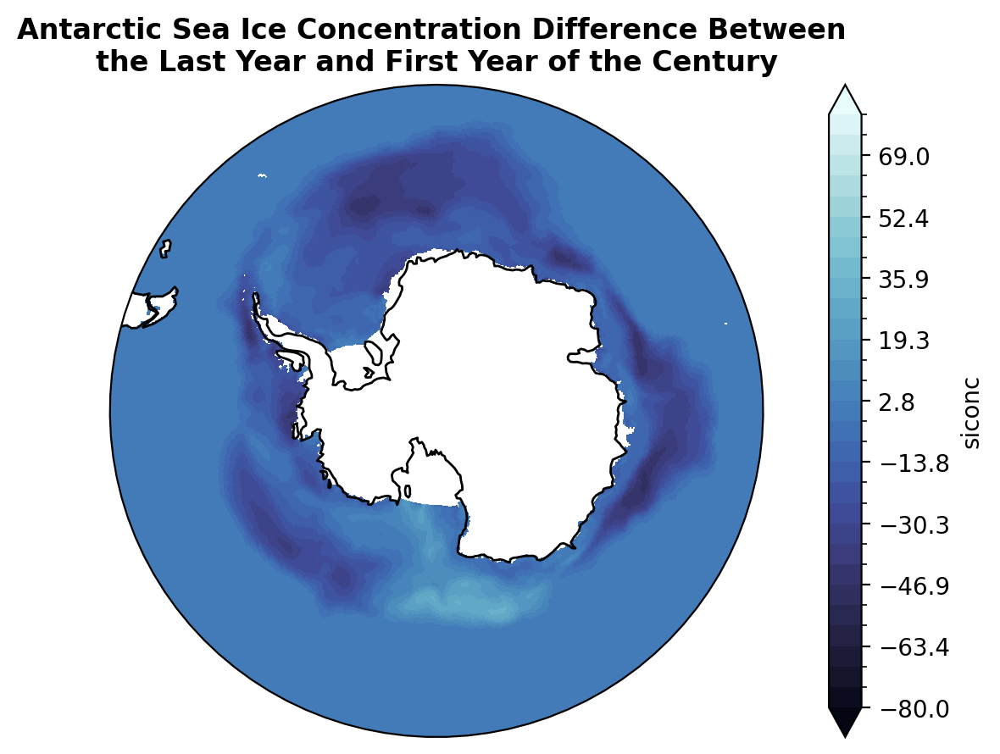

In [64]:
South_Polar_Model(difference, -80, 80, cmocean.cm.ice)
plt.title('Antarctic Sea Ice Concentration Difference Between \nthe Last Year and First Year of the Century', fontweight='bold')

**Figure 21.** Difference between the first and last year of Antarctic sea ice concentration simulated by the GDFL-ESM4 SSP5-8.5 experiment simulation which was from 2015-2100 in the Arctic. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL).

---

# CLIMATE MODEL PROJECTION OF SST

## datasets
gfdl_esm4_historical_sst (data provided in Zarr format via
Google Cloud).
Monthly simulated sea surface temperature (tos) output from GFDL-ESM4 under
the SSP5-8.5 scenario spanning January 2015 – December 2100. Model output
contributed to the sixth phase of the Coupled Model Intercomparison Project
(CMIP6) and made available via Google Cloud:
[https://console.cloud.google.com/marketplace/product/noaa-public/cmip6](https://console.cloud.google.com/marketplace/product/noaa-public/cmip6)
Units: degrees Celsius
gfdl_esm4_cell_area (data provided in Zarr format via
Google Cloud).
Ocean grid cell area provided on the same grid as the sea surface temperature
model output.
Units: grid cell area in m 

### The code in the cell below reads in climate model results stored in the Google Cloud from the GFDL-ESM4 Earth System Model developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL). The results are monthly sea surface temperature from the high-emissions future scenario, SSP5-85. A grid cell area file is also loaded in.

In [38]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')

In [39]:
gfdl_esm4_sst_data = df.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Omon' & \
    variable_id == 'tos' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gn' & \
    member_id == 'r1i1p1f1'"
)

# this only needs to be created once
gcs = gcsfs.GCSFileSystem(token='anon')
# get the path to a specific zarr store (the first one from the dataframe above)
zstore_sst = gfdl_esm4_sst_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_sst = gcs.get_mapper(zstore_sst)
# open the dataset using xarray and zarr
gfdl_esm4_ssp585_sst = xr.open_zarr(mapper_sst, 
                                         consolidated=True,use_cftime=True
                                         ).tos.rename({'y':'latitude',
                                                             'x':'longitude',
                                                             'lat':'geolat',
                                                             'lon':'geolon'})
gfdl_esm4_ssp585_sst

<xarray.DataArray 'tos' (time: 1032, latitude: 576, longitude: 720)>
dask.array<open_dataset-tos, shape=(1032, 576, 720), dtype=float32, chunksize=(64, 576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * time       (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    long_name:      Sea Surface Temperature
    original_name:  tos
    standard_name:  sea_surface_temperature
    units:          degC

In [40]:
gfdl_esm4_cell_area_data = df.query(
    "activity_id=='CMIP' & \
    table_id == 'Ofx' & \
    variable_id == 'areacello' & \
    experiment_id == 'piControl' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gn'")

# get the path to a specific zarr store (the first one from the dataframe above)
zstore_area = gfdl_esm4_cell_area_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_area = gcs.get_mapper(zstore_area)
# open the dataset using xarray and zarr
gfdl_esm4_cell_area = xr.open_zarr(mapper_area, 
                                         consolidated=True,
                                         ).areacello.rename({'y':'latitude',
                                                             'x':'longitude',
                                                             'lat':'geolat',
                                                             'lon':'geolon'})
gfdl_esm4_cell_area

<xarray.DataArray 'areacello' (latitude: 576, longitude: 720)>
dask.array<open_dataset-areacello, shape=(576, 720), dtype=float32, chunksize=(576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
Attributes:
    cell_methods:   area: sum
    long_name:      Grid-Cell Area
    original_name:  areacello
    standard_name:  cell_area
    units:          m2

In [54]:
#grouping the dataset by years and averaging time out
annual_SST=gfdl_esm4_ssp585_sst.groupby('time.year').mean(dim='time')
#weighting the data
global_weighted_avg_SST= annual_SST.weighted(gfdl_esm4_cell_area).mean(['latitude', 'longitude'])

In [55]:
#slicing for the polar regions
arc_lat_slice_ssp=annual_SST.sel(latitude=slice(0,90))
ant_lat_slice_ssp=annual_SST.sel(latitude=slice(-90,0))

In [57]:
#SST for the polar regions
arctic_weighted_avg_SST= arc_lat_slice_ssp.weighted(gfdl_esm4_cell_area).mean(['latitude', 'longitude'])
antarctic_weighted_avg_SST= ant_lat_slice_ssp.weighted(gfdl_esm4_cell_area).mean(['latitude', 'longitude'])

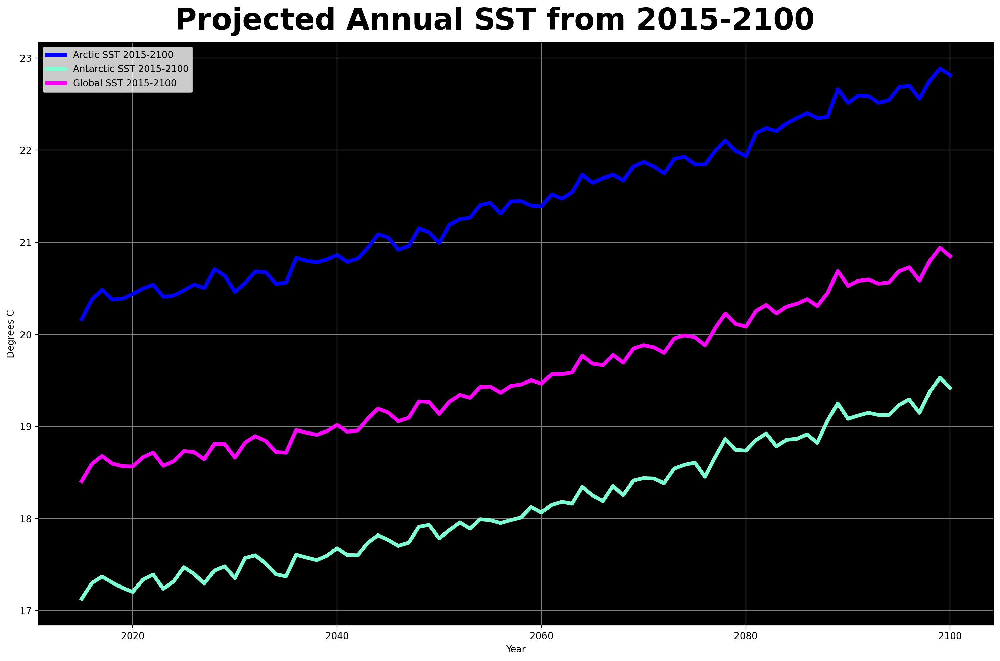

In [59]:
fig, (ax) = plt.subplots(nrows = 1, ncols = 1, figsize = (15, 10))

fig.suptitle('Projected Annual SST from 2015-2100 ', fontsize=32,fontweight='bold')

ax.grid(color='grey')

ax.plot(arctic_weighted_avg_SST['year'], arctic_weighted_avg_SST, linewidth=4,label='Arctic SST 2015-2100', color='blue')
ax.plot(antarctic_weighted_avg_SST['year'], antarctic_weighted_avg_SST, linewidth=4, label='Antarctic SST 2015-2100', color='aquamarine')
ax.plot(global_weighted_avg_SST['year'], global_weighted_avg_SST, linewidth=4, label='Global SST 2015-2100', color='fuchsia')

ax.legend()
ax.set_ylabel('Degrees C')
ax.set_xlabel('Year')

ax.set_facecolor('black')

plt.tight_layout()

**Figure 22.** Area-weighted projected sea surface temperatures from 2015-2100. Sea surface temperatures were simulated by NOAA's GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100.

In [100]:
#grouping the dataset by months and averaging time out
monthly_model_ssp=gfdl_esm4_ssp585_sst.groupby('time.month').mean(dim='time')
monthly_model_ssp

<xarray.DataArray 'tos' (month: 12, latitude: 576, longitude: 720)>
dask.array<stack, shape=(12, 576, 720), dtype=float32, chunksize=(1, 576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    long_name:      Sea Surface Temperature
    original_name:  tos
    standard_name:  sea_surface_temperature
    units:          degC

In [103]:
#need to slice latitude
monthly_global_weighted_SST=monthly_model_ssp.weighted(gfdl_esm4_cell_area).mean(['latitude', 'longitude'])
sst_ant_lat_slice=monthly_model_ssp.sel(latitude=slice(-90, 0)).weighted(gfdl_esm4_cell_area).mean(['latitude', 'longitude'])
sst_arct_lat_slice=monthly_model_ssp.sel(latitude=slice(0,90)).weighted(gfdl_esm4_cell_area).mean(['latitude', 'longitude'])

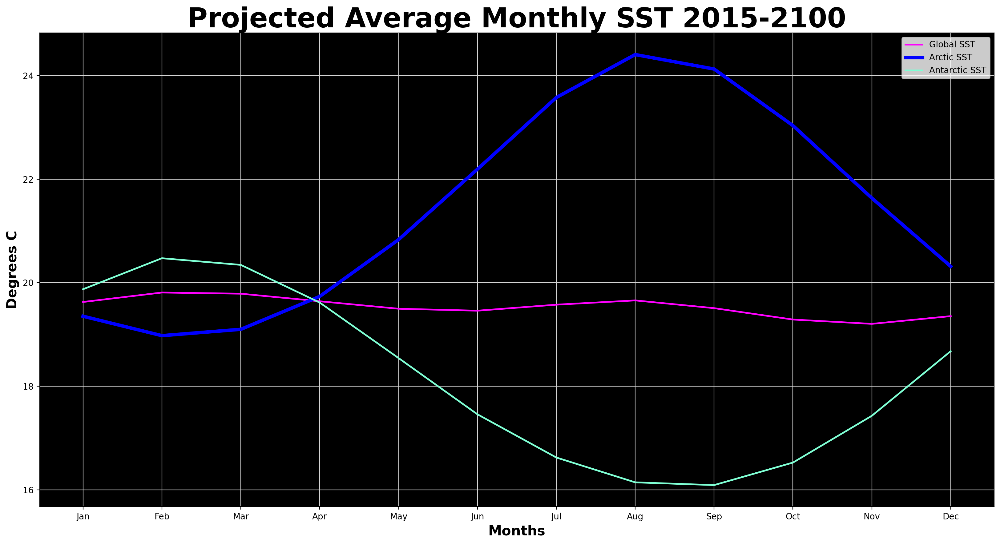

In [73]:
fig, ax = plt.subplots(figsize=(20,10))

ax.plot(monthly_global_weighted_SST['month'],monthly_global_weighted_SST, linewidth=2, label= 'Global SST', color='fuchsia')
ax.plot(sst_arct_lat_slice['month'],sst_arct_lat_slice, linewidth=4, label= 'Arctic SST', color='blue')
ax.plot(sst_ant_lat_slice['month'],sst_ant_lat_slice, linewidth=2, label= 'Antarctic SST', color='aquamarine')


ax.set_title('Projected Average Monthly SST 2015-2100',fontsize=32,fontweight='bold')
ax.set_xlabel('Months',fontsize=16,fontweight='bold')
ax.xaxis.set_ticks([1, 2, 3, 4, 5, 6, 7,  8, 9, 10, 11, 12],
              ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

ax.set_ylabel('Degrees C',fontsize=16,fontweight='bold')

plt.legend()
plt.grid(color='lightgrey')
ax.set_facecolor('black')

**Figure 23.** Projected average monthly SST from 2015-2100 simulated by NOAA's GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100.

In [117]:
seasonal_model_ssp=gfdl_esm4_ssp585_sst.groupby('time.season').mean(dim='time')
seasonal_model_ssp

<xarray.DataArray 'tos' (season: 4, latitude: 576, longitude: 720)>
dask.array<stack, shape=(4, 576, 720), dtype=float32, chunksize=(1, 576, 720), chunktype=numpy.ndarray>
Coordinates:
    geolat     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
    geolon     (latitude, longitude) float32 dask.array<chunksize=(576, 720), meta=np.ndarray>
  * longitude  (longitude) float64 -299.8 -299.2 -298.8 ... 58.75 59.25 59.75
  * latitude   (latitude) float64 -77.91 -77.72 -77.54 ... 89.47 89.68 89.89
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    cell_measures:  area: areacello
    cell_methods:   area: mean where sea time: mean
    long_name:      Sea Surface Temperature
    original_name:  tos
    standard_name:  sea_surface_temperature
    units:          degC

In [118]:
seasonal_model_ssp=gfdl_esm4_ssp585_sst.groupby('time.season').mean(dim='time')
model_winter=seasonal_model_ssp.sel(season='DJF')
model_spring=seasonal_model_ssp.sel(season='MAM')
model_summer=seasonal_model_ssp.sel(season='JJA')
model_fall=seasonal_model_ssp.sel(season='SON')

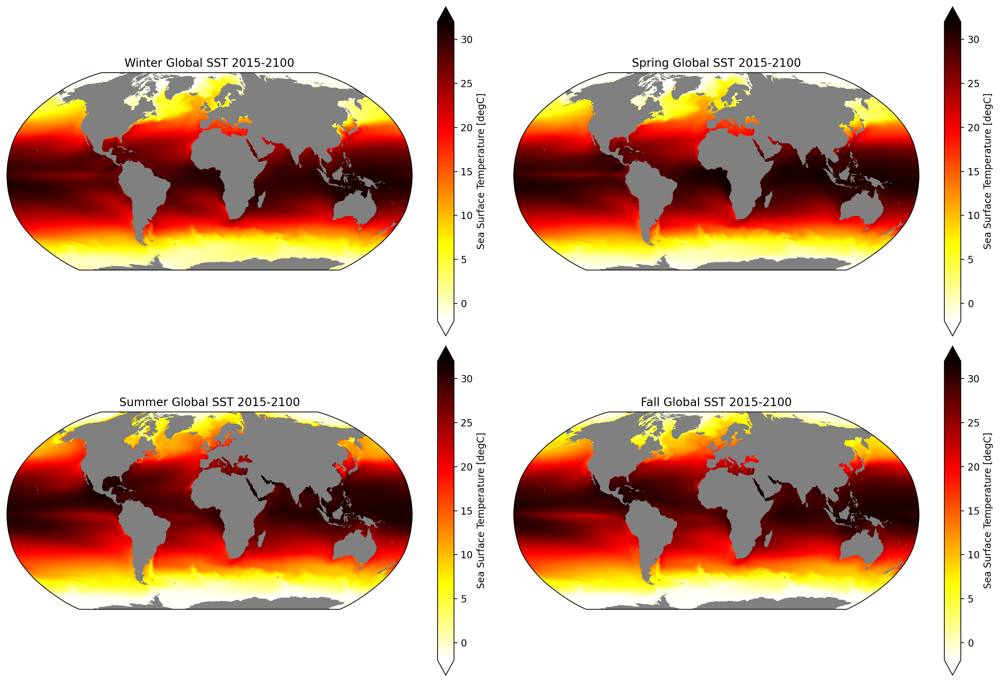

In [130]:
subplot_kws=dict(projection=ccrs.Robinson(), facecolor='grey')

fig, (ax)=plt.subplots(ncols=2,nrows=2, figsize=(15,10),subplot_kw=subplot_kws)
model_winter.plot(ax=ax[0,0], cmap='hot_r', vmin=-2,vmax=32, 
            extend='both',transform=ccrs.PlateCarree())
model_spring.plot(ax=ax[0,1], cmap='hot_r', vmin=-2,vmax=32, 
            extend='both',transform=ccrs.PlateCarree())
model_summer.plot(ax=ax[1,0], cmap='hot_r', vmin=-2,vmax=32, 
            extend='both',transform=ccrs.PlateCarree())
model_fall.plot(ax=ax[1,1], cmap='hot_r', vmin=-2,vmax=32, 
          extend='both',transform=ccrs.PlateCarree())

ax[0,0].set_title('Winter Global SST 2015-2100')
ax[0,1].set_title('Spring Global SST 2015-2100')
ax[1,0].set_title('Summer Global SST 2015-2100')
ax[1,1].set_title('Fall Global SST 2015-2100')

plt.tight_layout()

**Figure 24.** Seasonal SST averages on a global scale from 2015-2100 simulated by NOAA's GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100.

In [41]:
#SST at the end of the century vs. the start

sst_end=gfdl_esm4_ssp585_sst.sel(time=slice('2100-01-16', '2100-12-16')).mean(dim='time')
sst_start=gfdl_esm4_ssp585_sst.sel(time=slice('2015-01-16', '2015-12-16')).mean(dim='time')

#calculating the difference
sst_difference=sst_end-sst_start

Text(0.5, 1.0, 'Antarctic SST Difference Between the \nLast Year and First Year of the Century')

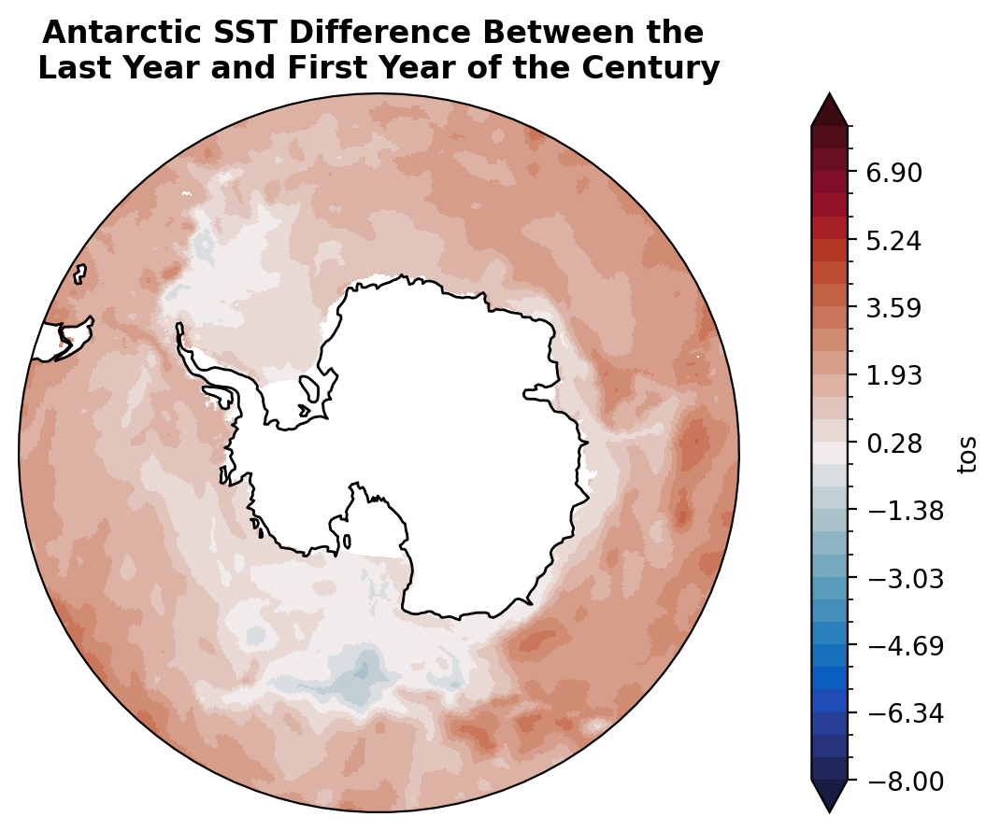

In [46]:
South_Polar_Model(sst_difference, -8, 8, cmocean.cm.balance)
plt.title('Antarctic SST Difference Between the \nLast Year and First Year of the Century', fontweight='bold')

**Figure 25.** Antarctic SST difference between the first and last year of the GDFL-ESM4 SSP5-8.5 experiment simulation which was from 2015-2100 in Antarctica. SST was simulated by GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL).

Text(0.5, 1.0, 'Arctic SST Difference Between the \nLast Year and First Year of the Century')

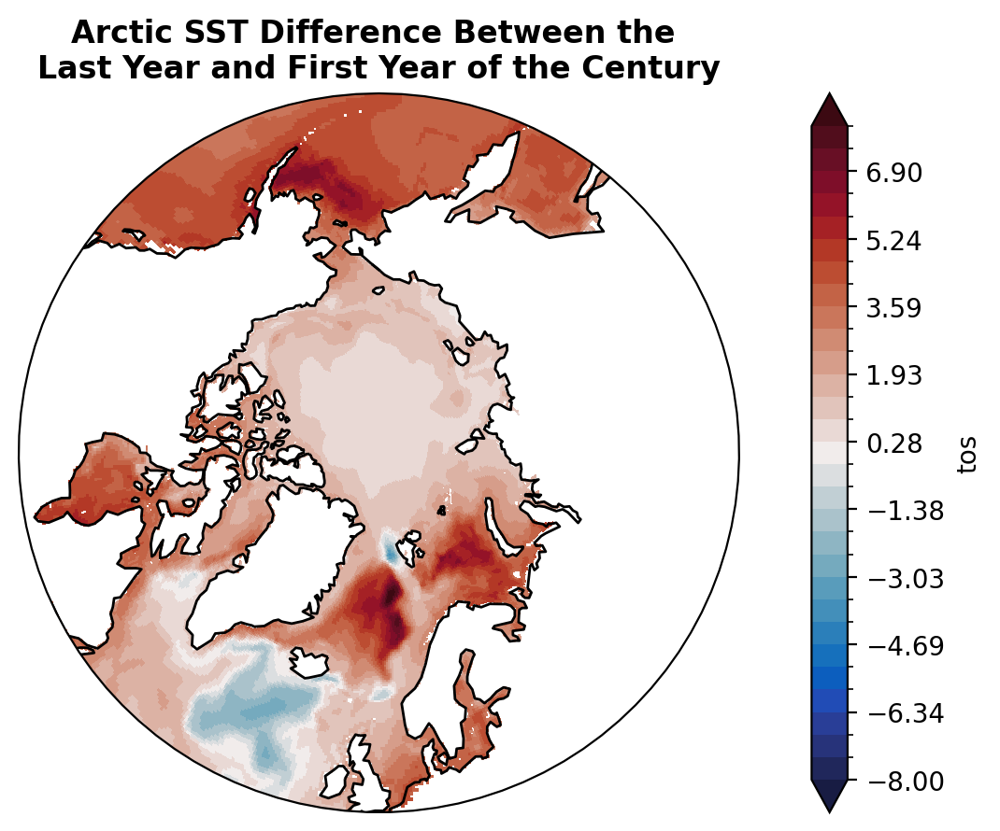

In [47]:
North_Polar_Model(sst_difference, -8, 8, cmocean.cm.balance)
plt.title('Arctic SST Difference Between the \nLast Year and First Year of the Century', fontweight='bold')

**Figure 26.** Arctic SST difference between the first and last year of the GDFL-ESM4 SSP5-8.5 experiment simulation which was from 2015-2100 in Antarctica. SST was simulated by GFDL-ESM4 under the SSP5-8.5 scenario spanning January 2015 – December 2100. Model output developed at NOAA's Geophysical Fluid Dynamics Laboratory (GFDL).

---

# <span style="color:dodgerblue"> Projected rate of change in global average SST vs SST rate of change in the polar regions </span> 
 The projected rate of SST is much slower than th projectede rise in SST in the polar regions. Part of this is due to Arctic Amplificatio and the ice-albedo feedback loop. We saw that from the sea ice extent plots sea ice concentration is declining and projected to decline further with increased warming. Without as much sea ice, more incoming solar radiation gets absorbed by the dark ocean. This is not what the polar regions are used to which is why they are experiencing higher rates of change. ?

---

# Final Thoughts

You made it to the end! I hope you learned something new about the polar regions and why they are warming at a faster rate than the rest of the world. We explored what sea ice was and how it is measured quantitatively. We also looked at sea surface temperatures and how it is projected to change under the SSP5-8.5 scenario. We also visualized what simulated sea ice concentration and extent is expected to change as well. We looked at sea ice and sea surface temperatures on different time scales. Anomalies were calculated as well to visualize the change between past and simulated future conditions of the polar regions. If we are to stay on track with the emission budgets for the SSP5-8.5 scenario, we are expected to see results similar to or worse than what NOAA's GFDL ESM4 model simulated. If we want to lessen the SST anomalies, we must start to reduce GHG emissions and develop more efficient carbon removal strategies. Heightening sea surface temperature has implications for ocean circulation dynamics, biodiversity, and sea level rise. Although the model outputs we explored were alarming, they are merely projections. We still have time to make a difference but we must start today. Yesterday is gone and too many push-offs until tomorrow will keep us on this path. To know about climate change without any change in behavior is the same thing as being a climate denial. If we stay comfortable now, we will be beyond miserable by 2100.